In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [ ]:
!git clone https://github.com/Chuyuan-04/STA141B.git

Cloning into 'STA141B'...
remote: Enumerating objects: 81, done.
remote: Counting objects: 100% (81/81), done.
remote: Compressing objects: 100% (78/78), done.
remote: Total 81 (delta 31), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (81/81), 9.16 MiB | 7.24 MiB/s, done.
Resolving deltas: 100% (31/31), done.


This code loads and combines all flight data stored in Parquet format. First, it specifies the directory /content/STA141B/parquet_data and uses os.listdir to collect all files ending with .parquet, building a sorted list of their full paths. Then, each Parquet file is read into a pandas DataFrame with pd.read_parquet, and all DataFrames are concatenated row-wise into a single tidy dataset called tidy_df using pd.concat with ignore_index=True. To verify that the data have been loaded correctly, the script prints the first few rows of tidy_df and the total number of observations. Finally, it groups the data by origin and dest and reports the number of records for each route, providing a quick summary of how many observations are available for each origin–destination pair.

In [ ]:
import os
import pandas as pd

# 1. Read and stack all parquet files
base = "/content/STA141B/parquet_data"
paths = sorted(
    os.path.join(base, f)
    for f in os.listdir(base)
    if f.endswith(".parquet")
)
dfs = [pd.read_parquet(p) for p in paths]
tidy_df = pd.concat(dfs, ignore_index=True)

print(tidy_df.head())
print("Number of rows:", len(tidy_df))
print("\nCounts by route:")
print(tidy_df.groupby(["origin", "dest"]).size())

       ItinID        MKT_ID  MktCoupons  Year  Quarter  OriginAirportID  \
0  2018129097  2.018129e+11           1  2018        1            11292   
1  2018142092  2.018142e+11           1  2018        1            11292   
2  2018149893  2.018150e+11           1  2018        1            11292   
3  2018149894  2.018150e+11           1  2018        1            11292   
4  2018150890  2.018151e+11           1  2018        1            11292   

  Origin ORIGIN_STATE_ABR  DestAirportID Dest  ... OP_CARRIER_GROUP  \
0    DEN               CO        12478.0  JFK  ...               DL   
1    DEN               CO        12478.0  JFK  ...               DL   
2    DEN               CO        12478.0  JFK  ...               DL   
3    DEN               CO        12478.0  JFK  ...               DL   
4    DEN               CO        12478.0  JFK  ...               DL   

  OPERATING_CARRIER Passengers  MktFare  MktDistance  MARKET_MILES_FLOWN  \
0                DL        1.0    66.93       

In [ ]:
avg_fare_od = (
    tidy_df
    .query("MktCoupons == 1")
    .groupby(["origin", "dest"])
    .agg(
        mean_fare=("MktFare", "mean"),
        median_fare=("MktFare", "median"),
        sd_fare=("MktFare", "std"),
        total_passengers=("Passengers", "sum")
    )
    .reset_index()
)
display(avg_fare_od)

,origin,dest,mean_fare,median_fare,sd_fare,total_passengers
0,DEN,JFK,248.301137,209.0,164.320768,90730.0
1,DFW,ORD,237.790614,205.5,339.992227,336272.0
2,JFK,DEN,248.633476,210.5,167.000025,93799.0
3,JFK,MCO,219.255395,186.5,148.366892,344190.0
4,LAS,LAX,142.381701,113.5,145.117727,490084.0
5,LAX,LAS,142.063498,112.0,346.291149,488876.0
6,LAX,SFO,156.553839,133.5,168.211891,592169.0
7,MCO,JFK,220.903841,187.0,150.482086,347524.0
8,ORD,DFW,238.772642,206.5,203.995232,334852.0
9,SEA,SFO,199.973412,184.5,137.361241,329674.0


/tmp/ipython-input-260039872.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


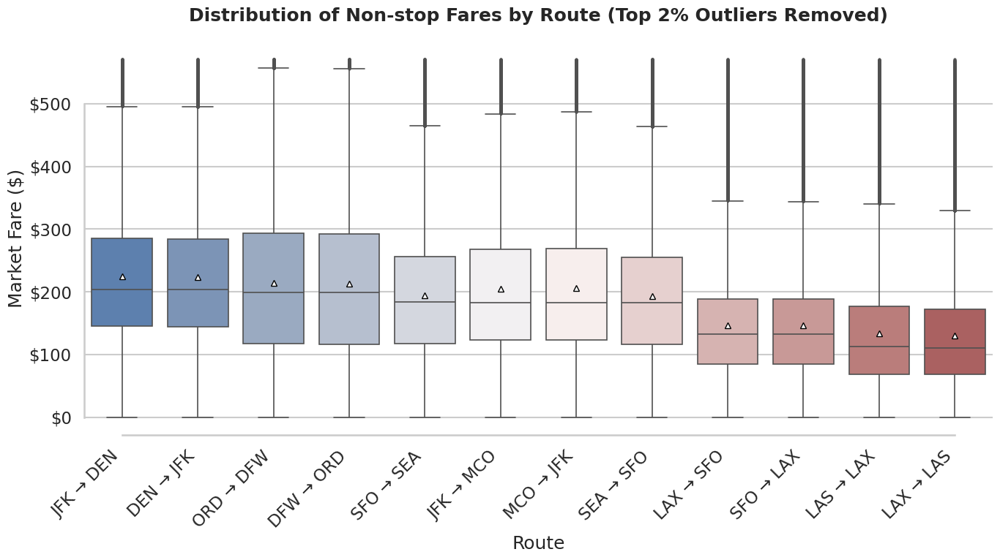

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

plot_data = tidy_df.query("MktCoupons == 1").copy()
plot_data['Route'] = plot_data['origin'] + ' → ' + plot_data['dest']

upper_limit = plot_data['MktFare'].quantile(0.98)
plot_data = plot_data[plot_data['MktFare'] < upper_limit]

order = plot_data.groupby('Route')['MktFare'].median().sort_values(ascending=False).index

sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(14, 8))

ax = sns.boxplot(
    data=plot_data,
    x='Route',
    y='MktFare',
    order=order,
    palette="vlag",
    showmeans=True,
    meanprops={"marker": "^", "markerfacecolor": "white", "markeredgecolor": "black"},
    fliersize=2,
    linewidth=1.2
)

plt.title("Distribution of Non-stop Fares by Route (Top 2% Outliers Removed)", weight='bold', pad=20)
plt.xlabel("Route")
plt.ylabel("Market Fare ($)")

ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('$%.0f'))
plt.xticks(rotation=45, ha='right')

sns.despine(trim=True)
plt.tight_layout()
plt.show()

Draw a moving average plot

In [ ]:
# 1. Rename columns
tidy_df = tidy_df.rename(columns={
    'ITIN_ID': 'ItinID',
    'MARKET_COUPONS': 'MktCoupons',
    'YEAR': 'Year',
    'QUARTER': 'Quarter',
    'ORIGIN_AIRPORT_ID': 'OriginAirportID',
    'ORIGIN': 'Origin',
    'DEST_AIRPORT_ID': 'DestAirportID',
    'DEST': 'Dest',
    'TICKET_CARRIER': 'TkCarrier',
    'MARKET_FARE': 'MktFare',
    'MARKET_DISTANCE': 'MktDistance',
    'PASSENGERS': 'Passengers'
})

# 2. Fix empty Carrier data (Critical: your previous output showed TkCarrier was NaN)
if 'OPERATING_CARRIER' in tidy_df.columns:
    tidy_df['TkCarrier'] = tidy_df['TkCarrier'].fillna(tidy_df['OPERATING_CARRIER'])

# 3. Drop duplicate lowercase columns if they exist (to avoid confusion between 'Origin' and 'origin')
tidy_df = tidy_df.loc[:, ~tidy_df.columns.duplicated()]

print(tidy_df.head())
print(tidy_df.columns)

       ItinID        MKT_ID  MktCoupons  Year  Quarter  OriginAirportID  \
0  2018129097  2.018129e+11           1  2018        1            11292   
1  2018142092  2.018142e+11           1  2018        1            11292   
2  2018149893  2.018150e+11           1  2018        1            11292   
3  2018149894  2.018150e+11           1  2018        1            11292   
4  2018150890  2.018151e+11           1  2018        1            11292   

  Origin ORIGIN_STATE_ABR  DestAirportID Dest  ... OP_CARRIER_GROUP  \
0    DEN               CO        12478.0  JFK  ...               DL   
1    DEN               CO        12478.0  JFK  ...               DL   
2    DEN               CO        12478.0  JFK  ...               DL   
3    DEN               CO        12478.0  JFK  ...               DL   
4    DEN               CO        12478.0  JFK  ...               DL   

  OPERATING_CARRIER Passengers  MktFare  MktDistance  MARKET_MILES_FLOWN  \
0                DL        1.0    66.93       

In [ ]:
# Outlier removal by IQR
def remove_outliers_iqr(df, column="MktFare"):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    print("The IQR is", IQR)

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # Keep only data within the valid range
    df = df[(df[column] >= lower) & (df[column] <= upper)].copy()
    return df, IQR

# Remove flights that contain transfers (keep non-stop only)
def remove_transfer(df):
    # MktCoupons == 1 means non-stop
    df = df[df['MktCoupons'] == 1].copy()
    df = df.dropna(subset=['MktFare', 'Passengers'])
    return df

# --- 1. Data Integrity Check ---
# Ensure df is defined using the cleaned tidy_df before proceeding
# This addresses the NameError if previous cleaning steps were not executed correctly or are missing.

# Start with tidy_df (which is already loaded and preprocessed)
df = tidy_df.copy()

# Apply cleaning steps as intended from previous cells
df = remove_transfer(df)
df, _ = remove_outliers_iqr(df) # IQR is not used in this cell, so we can ignore it

# Ensure Year and Quarter are treated as discrete integers, not floats
df["Year"] = df["Year"].astype(int)
df["Quarter"] = df["Quarter"].astype(int)

# Optional: Print unique values to verify data range
print("Years available:", df["Year"].unique())
print("Quarters available:", df["Quarter"].unique())

# --- 2. Calculate Quarterly Average Fares ---
all_routes_quarterly = (
    df
    .query("MktCoupons == 1")

    # Grouping Logic:
    # Must include 'Year' to distinguish 2018 Q1 from 2019 Q1.
    .groupby(["Year", "Quarter", "Origin", "Dest"])["MktFare"]
    .mean()
    .reset_index()
)

# Inspect the result to ensure 2018-2024 data is separated correctly
print(all_routes_quarterly.head())

The IQR is 143.44
Years available: [2018 2019 2020 2021 2022 2023 2024]
Quarters available: [1 2 3 4]
   Year  Quarter Origin Dest     MktFare
0  2018        1    DEN  JFK  206.062228
1  2018        1    DFW  ORD  194.989013
2  2018        1    JFK  DEN  205.390774
3  2018        1    JFK  MCO  193.052053
4  2018        1    LAS  LAX  124.707897


In [ ]:
print(df["Year"].unique()[:20])
print(df["Quarter"].unique()[:20])
print(df[ df["Year"].isna() | df["Quarter"].isna() ][["Year", "Quarter"]].head())

[2018 2019 2020 2021 2022 2023 2024]
[1 2 3 4]
Empty DataFrame
Columns: [Year, Quarter]
Index: []


In [ ]:
# Outlier removal by IQR
def remove_outliers_iqr(df, column="MktFare"):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    print("The IQR is", IQR)

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # Keep only data within the valid range
    df = df[(df[column] >= lower) & (df[column] <= upper)].copy()
    return df, IQR

# Remove flights that contain transfers (keep non-stop only)
def remove_transfer(df):
    # MktCoupons == 1 means non-stop
    df = df[df['MktCoupons'] == 1].copy()
    df = df.dropna(subset=['MktFare', 'Passengers'])
    return df


In [ ]:
df = remove_transfer(df)
df,IQR = remove_outliers_iqr(df)

The IQR is 132.78


/tmp/ipython-input-3848260866.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


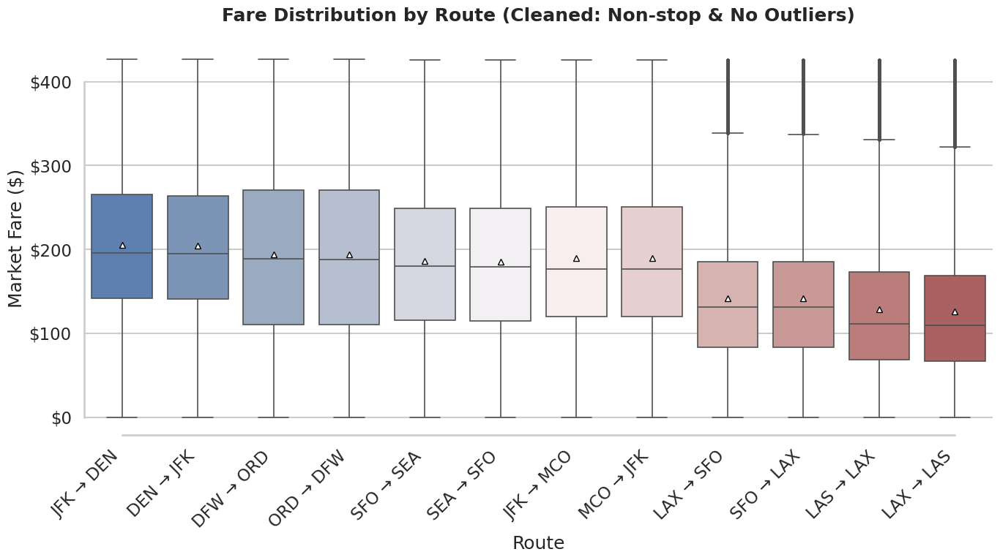

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker


# Create route label
df['Route'] = df['Origin'] + ' → ' + df['Dest']

# Sort routes by median fare (descending)
order = df.groupby('Route')['MktFare'].median().sort_values(ascending=False).index

# Setup plot
sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(14, 8))

# Draw boxplot
ax = sns.boxplot(
    data=df,
    x='Route',
    y='MktFare',
    order=order,
    palette="vlag",
    showmeans=True,
    meanprops={"marker": "^", "markerfacecolor": "white", "markeredgecolor": "black"},
    linewidth=1.2,
    fliersize=2
)

# Formatting
plt.title("Fare Distribution by Route (Cleaned: Non-stop & No Outliers)", weight='bold', pad=20)
plt.xlabel("Route")
plt.ylabel("Market Fare ($)")

# Add dollar sign to Y-axis
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('$%.0f'))
plt.xticks(rotation=45, ha='right')

sns.despine(trim=True)
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Ensure Year and Quarter are integers
df["Year"] = df["Year"].astype(int)
df["Quarter"] = df["Quarter"].astype(int)

# 1. Calculate the start month for each quarter (Q1=1, Q2=4, Q3=7, Q4=10)
start_months = (df["Quarter"] - 1) * 3 + 1

# 2. Create the base "Start Date" for every row
start_dates = pd.to_datetime(
    df["Year"].astype(str) + "-" + start_months.astype(str) + "-01"
)

# 3. Generate random day offsets (0 to 90 days) using NumPy
random_days = np.random.randint(0, 91, size=len(df))

# 4. Add offsets to start dates to get the simulated random date
df["random_date"] = start_dates + pd.to_timedelta(random_days, unit="D")

# Check result
print(df[["Year", "Quarter", "random_date"]].head())

   Year  Quarter random_date
0  2018        1  2018-01-29
1  2018        1  2018-02-08
2  2018        1  2018-03-15
3  2018        1  2018-01-09
4  2018        1  2018-03-02


In [ ]:
def plot_rolling_fare_trend(data_df, origin, dest, window_days=90, min_periods=30):
    route_label = f"{origin} → {dest}"
    print(f"--- Processing Route: {route_label} ---")

    # 1. Select OD pair (Using capitalized columns 'Origin'/'Dest')
    route_df = data_df[(data_df["Origin"] == origin) & (data_df["Dest"] == dest)].copy()

    if route_df.empty:
        print(f"Skipping {route_label}: No data found.")
        return

    # 2. Cleaning Step A: Keep ONLY Non-stop flights first
    # (We use the function defined earlier)
    route_df = remove_transfer(route_df)

    if route_df.empty:
        print(f"Skipping {route_label}: No non-stop flights found.")
        return

    # 3. Cleaning Step B: Remove Outliers (IQR) on the non-stop data
    route_df, IQR = remove_outliers_iqr(route_df)
    print(f"IQR used for cleaning: {IQR:.2f}")

    if len(route_df) < min_periods:
        print(f"Skipping {route_label}: Insufficient data ({len(route_df)}) after cleaning.")
        return

    # 4. Prepare for Rolling Average
    route_df = route_df.sort_values("random_date")
    route_df = route_df.set_index("random_date")

    # 5. Calculate Trend (Rolling Mean)
    trend = route_df["MktFare"].rolling(
        window=window_days,
        center=True,
        min_periods=min_periods
    ).mean()

    # 6. Visualization
    plt.figure(figsize=(14, 6))
    sns.set_theme(style="whitegrid", context="talk")

    # Background: Individual ticket prices (scatter)
    plt.scatter(
        route_df.index,
        route_df["MktFare"],
        s=10,
        alpha=0.15,
        color='gray',
        label="Individual Fares (Simulated Date)"
    )

    # Foreground: Rolling Trend Line
    plt.plot(
        route_df.index,
        trend,
        linewidth=3,
        color='#2b7bba', # Professional Blue
        label=f"{window_days}-Day Rolling Trend"
    )

    plt.title(f"Market Fare Trend: {route_label}", weight='bold')
    plt.xlabel("Date")
    plt.ylabel("Market Fare ($)")

    # Format Y-axis with dollar sign
    plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('$%.0f'))

    plt.legend()
    plt.tight_layout()
    plt.show()

--- Processing Route: LAX → LAS ---
The IQR is 102.0
IQR used for cleaning: 102.00


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


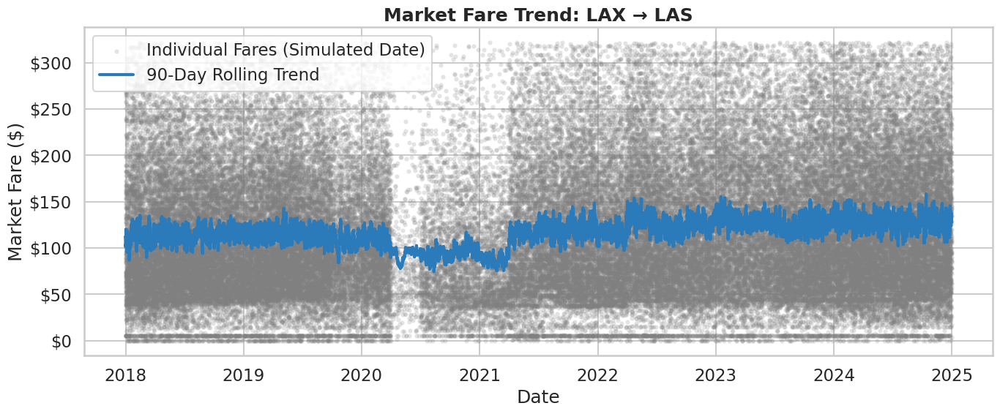

--- Processing Route: LAS → LAX ---
The IQR is 105.0
IQR used for cleaning: 105.00


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


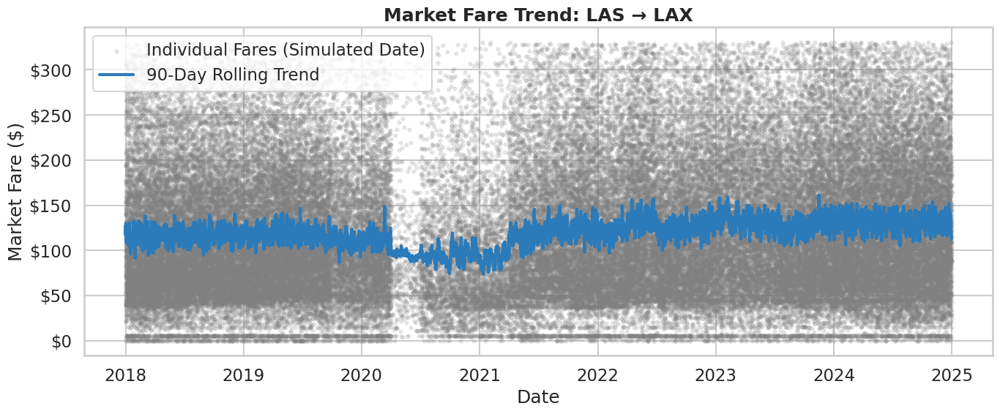

--- Processing Route: DEN → JFK ---
The IQR is 123.5
IQR used for cleaning: 123.50


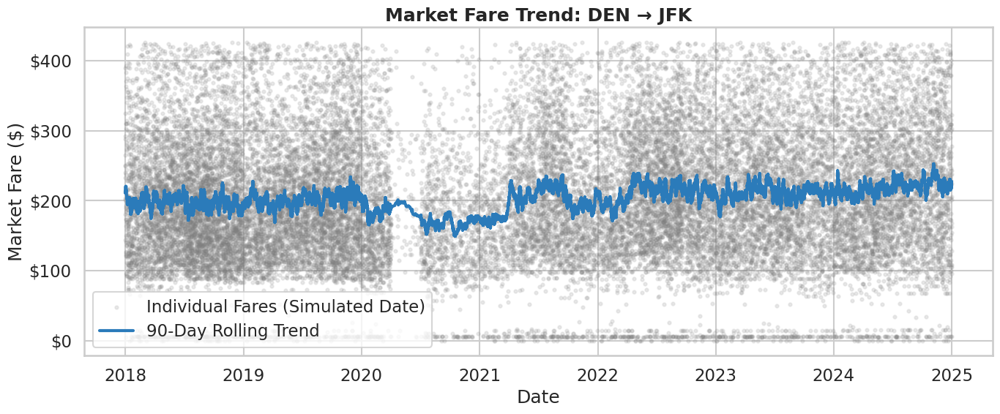

--- Processing Route: JFK → DEN ---
The IQR is 123.5
IQR used for cleaning: 123.50


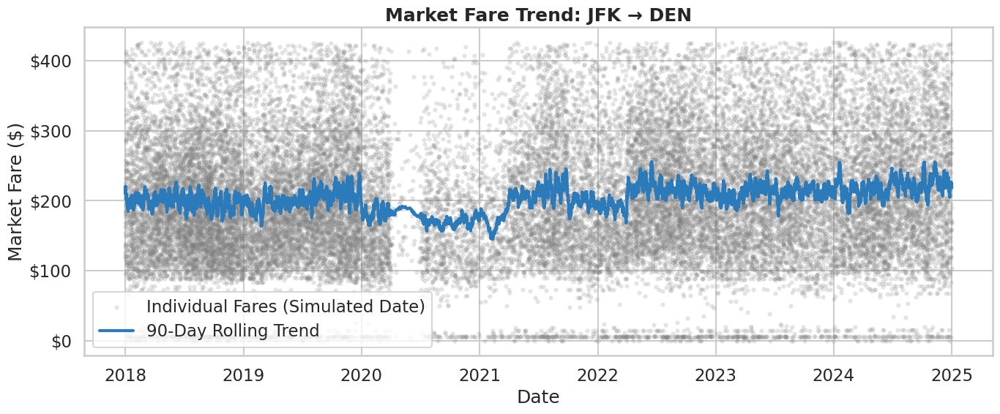

--- Processing Route: ORD → DFW ---
The IQR is 160.5
IQR used for cleaning: 160.50


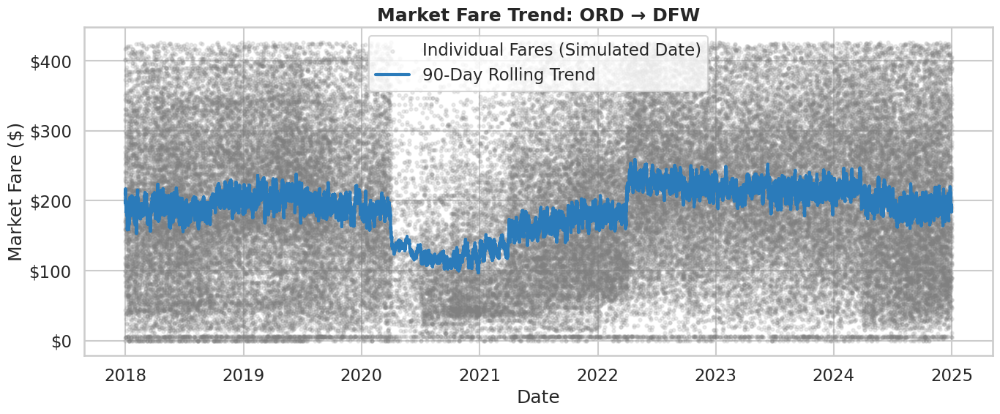

--- Processing Route: DFW → ORD ---
The IQR is 161.0
IQR used for cleaning: 161.00


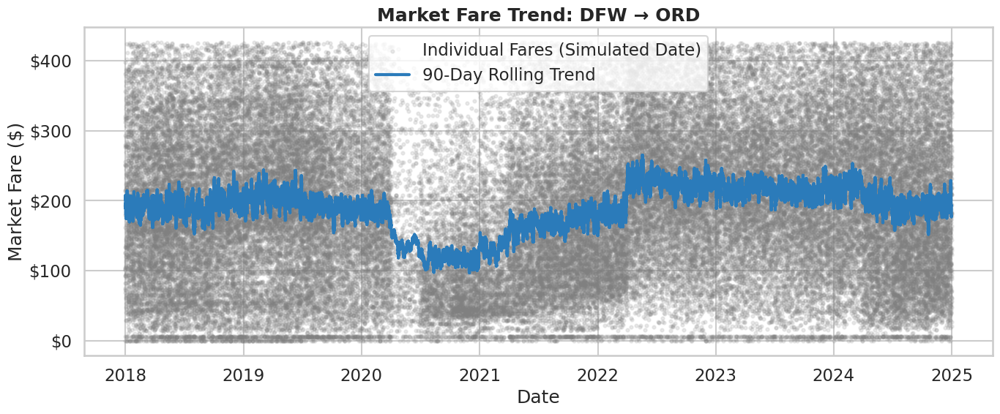

--- Processing Route: LAX → SFO ---
The IQR is 102.0
IQR used for cleaning: 102.00


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


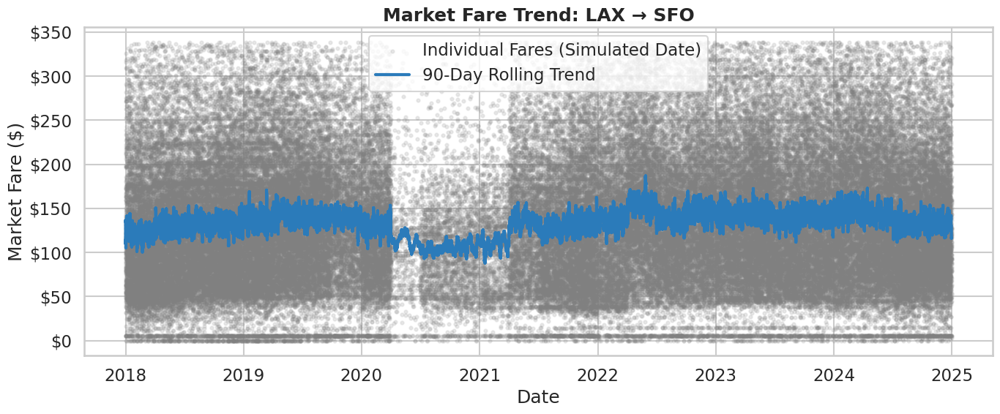

--- Processing Route: SFO → LAX ---
The IQR is 101.5
IQR used for cleaning: 101.50


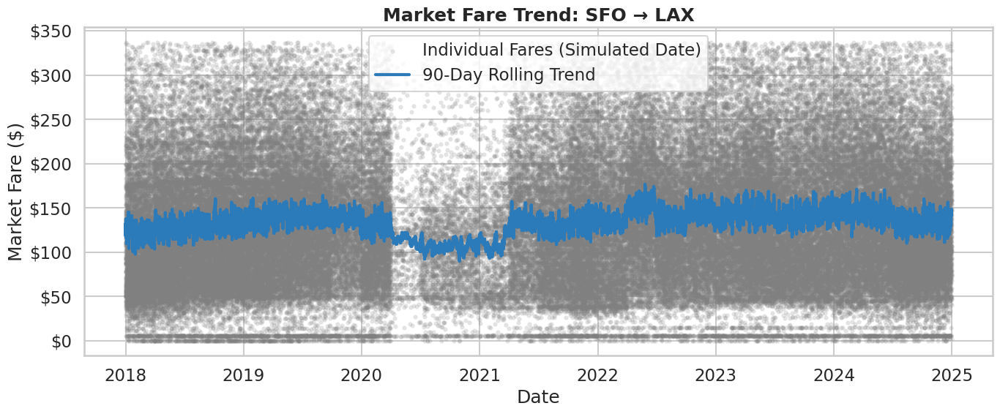

--- Processing Route: JFK → MCO ---
The IQR is 131.0
IQR used for cleaning: 131.00


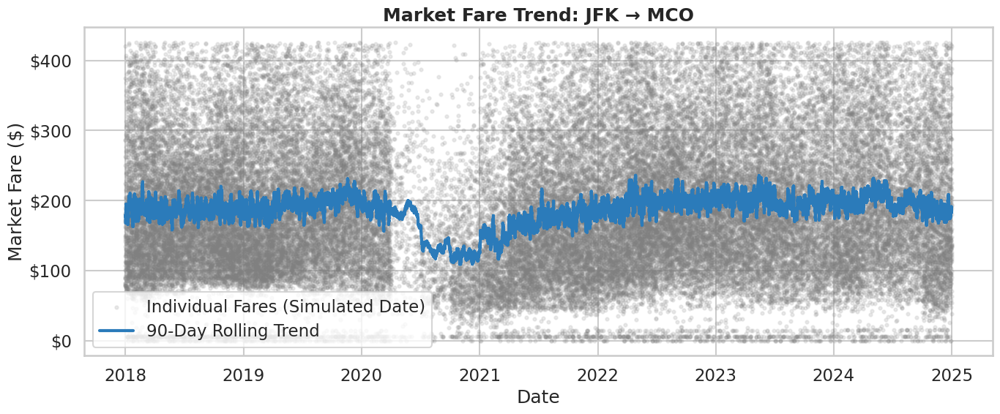

--- Processing Route: MCO → JFK ---
The IQR is 131.5
IQR used for cleaning: 131.50


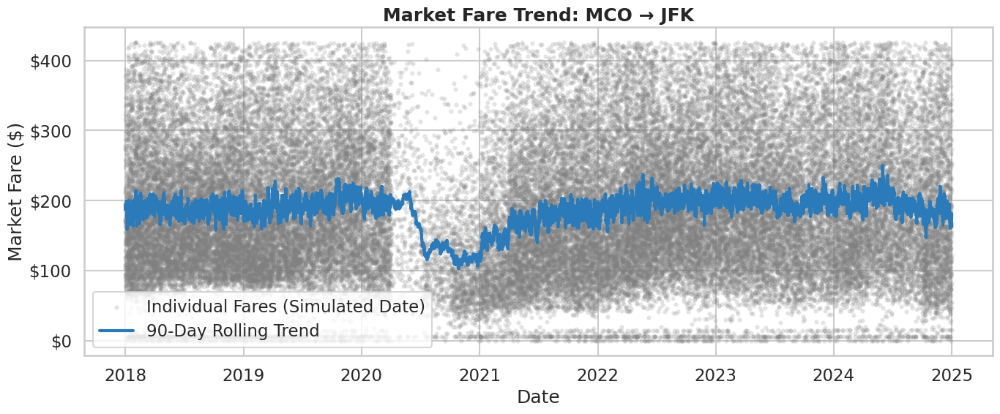

--- Processing Route: SFO → SEA ---
The IQR is 133.5
IQR used for cleaning: 133.50


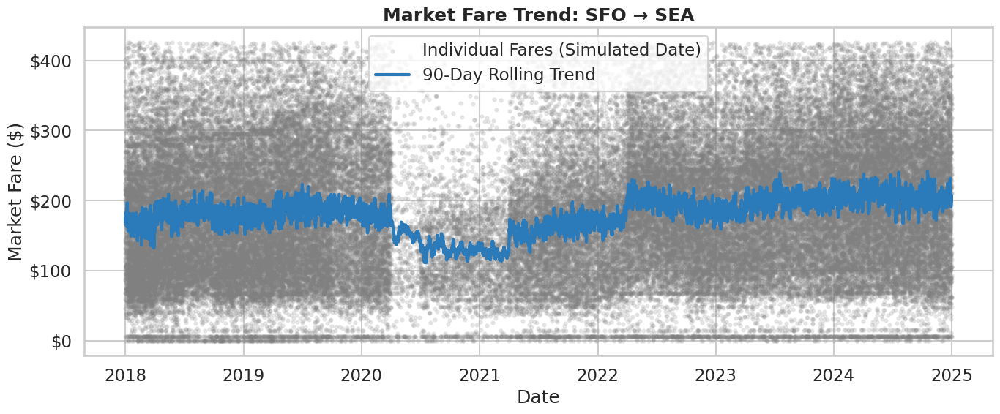

--- Processing Route: SEA → SFO ---
The IQR is 134.0
IQR used for cleaning: 134.00


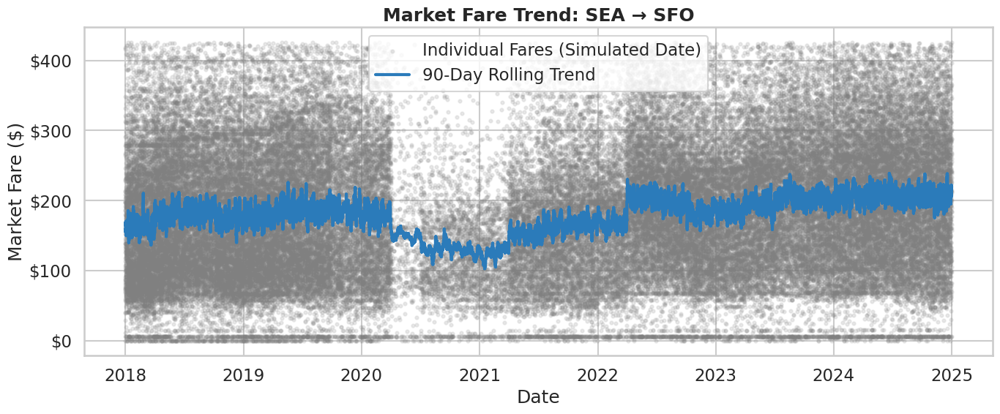

In [ ]:
od_pairs = [
    ("LAX", "LAS"),
    ("DEN", "JFK"),
    ("ORD", "DFW"),
    ("LAX", "SFO"),
    ("JFK", "MCO"),
    ("SFO", "SEA")
]

# Loop through the list and generate a plot for each pair
for origin, dest in od_pairs:
    plot_rolling_fare_trend(df, origin, dest)
    plot_rolling_fare_trend(df, dest, origin)

--- Generating Fourier Forecast for: LAX → SFO ---
Model R-squared: 0.005 (Interpretation: Fit Quality)


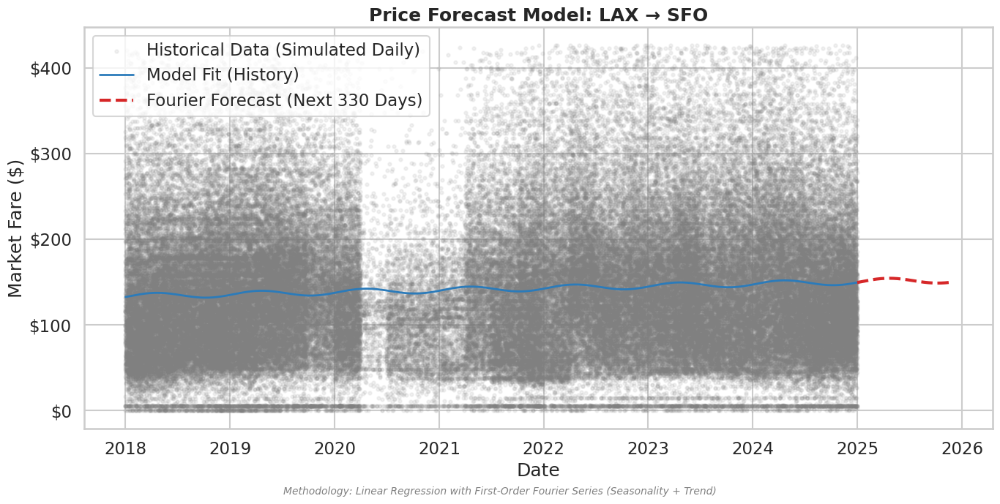

--- Generating Fourier Forecast for: JFK → MCO ---
Model R-squared: 0.002 (Interpretation: Fit Quality)


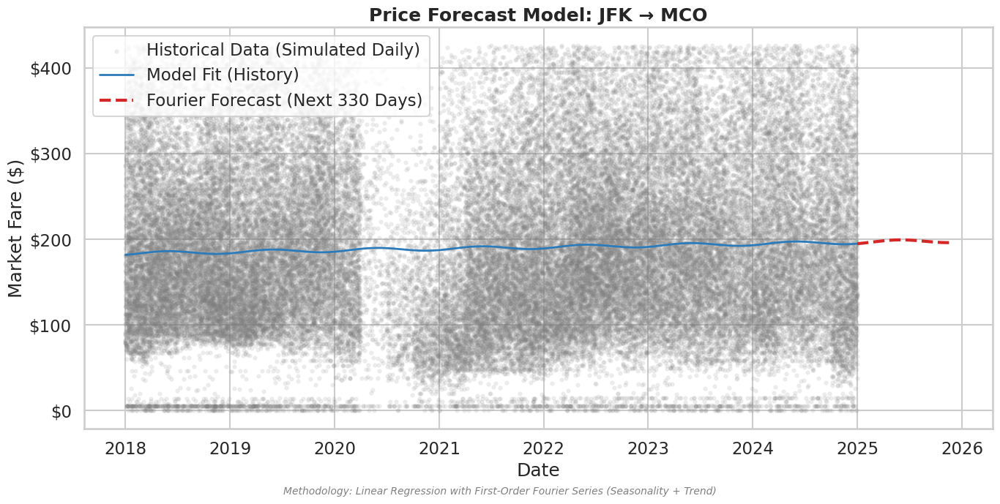

In [ ]:
from sklearn.linear_model import LinearRegression
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

def plot_fourier_forecast(data_df, origin, dest, forecast_days=330):
    """
    Fits a Fourier Series model (Linear Trend + Seasonality) to historical data
    and forecasts future prices.
    """
    route_label = f"{origin} → {dest}"
    print(f"--- Generating Fourier Forecast for: {route_label} ---")

    # 1. Filter Data for the specific route
    # Using 'Origin' and 'Dest' (Capitalized based on your previous cleaning)
    route_df = data_df[(data_df["Origin"] == origin) & (data_df["Dest"] == dest)].copy()

    if route_df.empty:
        print(f"Skipping {route_label}: No data found.")
        return

    # 2. Feature Engineering (Training Data)
    route_df = route_df.sort_values("random_date")
    start_date = route_df["random_date"].min()

    # Feature A: Time Index (Days since start) -> Captures long-term inflation/trend
    route_df['Time_Index'] = (route_df["random_date"] - start_date).dt.days

    # Feature B: Fourier Terms (Sine/Cosine) -> Captures annual seasonality (365.25 days)
    # This allows the model to learn "Summer is expensive, January is cheap"
    route_df['sin_time'] = np.sin(2 * np.pi * route_df['Time_Index'] / 365.25)
    route_df['cos_time'] = np.cos(2 * np.pi * route_df['Time_Index'] / 365.25)

    # 3. Train the Model
    features = ['Time_Index', 'sin_time', 'cos_time']
    X = route_df[features]
    y = route_df['MktFare']

    model = LinearRegression()
    model.fit(X, y)

    r_squared = model.score(X, y)
    print(f"Model R-squared: {r_squared:.3f} (Interpretation: Fit Quality)")

    # 4. Generate Future Data for Prediction
    last_real_date = route_df["random_date"].max()
    future_dates = pd.date_range(start=last_real_date, periods=forecast_days + 1, freq='D')[1:]

    future_df = pd.DataFrame({'date': future_dates})

    # Create the same features for the future
    future_df['Time_Index'] = (future_df['date'] - start_date).dt.days
    future_df['sin_time'] = np.sin(2 * np.pi * future_df['Time_Index'] / 365.25)
    future_df['cos_time'] = np.cos(2 * np.pi * future_df['Time_Index'] / 365.25)

    # Predict!
    future_df['Predicted_Fare'] = model.predict(future_df[features])

    # 5. Visualization
    plt.figure(figsize=(14, 7))
    sns.set_theme(style="whitegrid", context="talk")

    # A. Historical Data (Background Cloud)
    plt.scatter(
        route_df["random_date"],
        route_df["MktFare"],
        alpha=0.1,
        s=10,
        color='gray',
        label='Historical Data (Simulated Daily)'
    )

    # B. Historical Fit Line (Blue) - Shows how well the model learned the past
    # Create a smooth line for history by predicting on sorted historical dates
    route_df['Fitted_Fare'] = model.predict(X)
    plt.plot(
        route_df["random_date"],
        route_df["Fitted_Fare"],
        color='#2b7bba',
        linewidth=2,
        label='Model Fit (History)'
    )

    # C. Future Forecast Line (Red Dashed) - The Prediction
    plt.plot(
        future_df['date'],
        future_df['Predicted_Fare'],
        color='#d62728',
        linestyle='--',
        linewidth=3,
        label=f'Fourier Forecast (Next {forecast_days} Days)'
    )

    plt.title(f"Price Forecast Model: {route_label}", weight='bold')
    plt.xlabel("Date")
    plt.ylabel("Market Fare ($)")
    plt.legend(loc='upper left')

    # Format Y-axis
    plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('$%.0f'))

    # Add annotation for the methodology
    plt.figtext(0.5, 0.01,
                "Methodology: Linear Regression with First-Order Fourier Series (Seasonality + Trend)",
                ha="center", fontsize=10, style='italic', color='gray')

    plt.tight_layout()
    plt.show()

# --- Example Usage ---
plot_fourier_forecast(df, "LAX", "SFO")
plot_fourier_forecast(df, "JFK", "MCO")

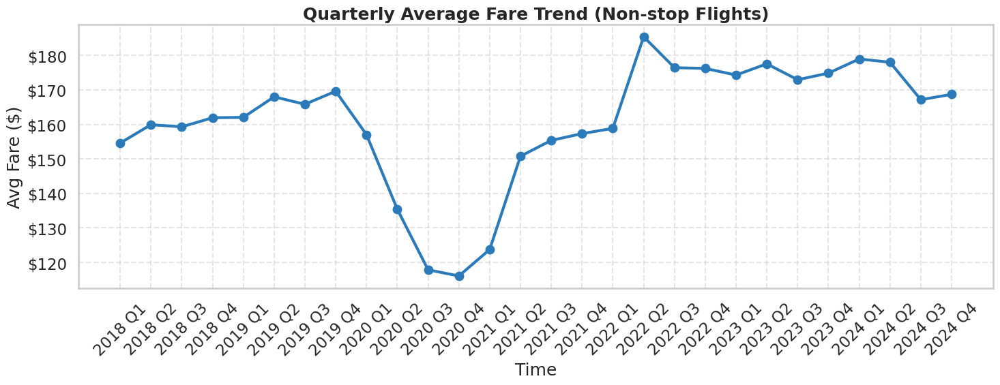

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# 1. Aggregate data: Calculate average fare per quarter
quarterly_data = (
    df.query("MktCoupons == 1")
    .groupby(["Year", "Quarter"])["MktFare"]
    .mean()
    .reset_index()
)

# Create readable labels (e.g., "2018 Q1")
quarterly_data['Label'] = quarterly_data['Year'].astype(str) + " Q" + quarterly_data['Quarter'].astype(str)

# 2. Plotting
sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(15, 6))

plt.plot(
    quarterly_data['Label'],
    quarterly_data['MktFare'],
    marker='o',
    linewidth=3,
    color='#2b7bba', # Professional blue
    label='Avg Fare'
)

# 3. Formatting
plt.title("Quarterly Average Fare Trend (Non-stop Flights)", weight='bold')
plt.ylabel("Avg Fare ($)")
plt.xlabel("Time")

# Add dollar sign to Y-axis
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('$%.0f'))

plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

plt.show()

### next step: fit the model & predict

# Switch gears and create the data frame for number of passengers vs quarters

In [ ]:
df.head(5)

,ItinID,MKT_ID,MktCoupons,Year,Quarter,OriginAirportID,Origin,ORIGIN_STATE_ABR,DestAirportID,Dest,...,Passengers,MktFare,MktDistance,MARKET_MILES_FLOWN,origin,dest,TK_CARRIER_GROUP,TkCarrier,Route,random_date
0,2018129097,2.018129e+11,1,2018,1,11292,DEN,CO,12478.0,JFK,...,1.0,66.93,1626.0,1626.0,DEN,JFK,NaN,DL,DEN → JFK,2018-01-14
1,2018142092,2.018142e+11,1,2018,1,11292,DEN,CO,12478.0,JFK,...,1.0,5.50,1626.0,1626.0,DEN,JFK,NaN,DL,DEN → JFK,2018-01-27
2,2018149893,2.018150e+11,1,2018,1,11292,DEN,CO,12478.0,JFK,...,1.0,209.61,1626.0,1626.0,DEN,JFK,NaN,DL,DEN → JFK,2018-02-08
3,2018149894,2.018150e+11,1,2018,1,11292,DEN,CO,12478.0,JFK,...,1.0,238.56,1626.0,1626.0,DEN,JFK,NaN,DL,DEN → JFK,2018-03-02
4,2018150890,2.018151e+11,1,2018,1,11292,DEN,CO,12478.0,JFK,...,1.0,206.24,1626.0,1626.0,DEN,JFK,NaN,DL,DEN → JFK,2018-03-19


In [ ]:
def sum_all_passengers_by_year_quarter(df):
    # Create a local copy to avoid modifying the original dataframe
    local_df = df.copy()

    # Ensure Year and Quarter are integers
    local_df["Year"] = local_df["Year"].astype(int)
    local_df["Quarter"] = local_df["Quarter"].astype(int)

    # Group by time and route to sum passengers
    # Note: Using Capitalized 'Origin' and 'Dest' to match cleaned data
    quarterly_totals = (
        local_df.groupby(["Year", "Quarter", "Origin", "Dest"])["Passengers"]
        .sum()
        .reset_index()
    )

    # Rename column for clarity
    quarterly_totals.rename(columns={'Passengers': 'TotalPassengers'}, inplace=True)

    return quarterly_totals

In [ ]:
total_passengers = sum_all_passengers_by_year_quarter(df)
print(total_passengers)

     Year  Quarter Origin Dest  TotalPassengers
0    2018        1    DEN  JFK           3539.0
1    2018        1    DFW  ORD          13951.0
2    2018        1    JFK  DEN           3649.0
3    2018        1    JFK  MCO          13293.0
4    2018        1    LAS  LAX          21081.0
..    ...      ...    ...  ...              ...
331  2024        4    MCO  JFK          14341.0
332  2024        4    ORD  DFW          14003.0
333  2024        4    SEA  SFO          13353.0
334  2024        4    SFO  LAX          26482.0
335  2024        4    SFO  SEA          13390.0

[336 rows x 5 columns]


In [ ]:
def filter_bidirectional_od_pairs(df, od_pairs):
    # 1. Normalize target list (ignore direction, e.g., JFK-LAX same as LAX-JFK)
    normalized_target_pairs = set(
        tuple(sorted(pair)) for pair in od_pairs
    )

    # 2. Create helper column in df to match normalized pairs
    # CRITICAL: Using 'Origin' and 'Dest' (Capitalized)
    df['OD_pair'] = df.apply(
        lambda row: tuple(sorted((row['Origin'], row['Dest']))),
        axis=1
    )

    # 3. Filter data
    filtered_df = df[df['OD_pair'].isin(normalized_target_pairs)].copy()

    # 4. Create TimePoint (First day of the Quarter)
    # Logic: Q1->1 (Jan), Q2->4 (Apr), Q3->7 (Jul), Q4->10 (Oct)
    filtered_df['TimePoint'] = pd.to_datetime(
        filtered_df['Year'].astype(str) + '-' +
        (filtered_df['Quarter'] * 3 - 2).astype(str) + '-01'
    )

    return filtered_df


df_total_passengers = filter_bidirectional_od_pairs(total_passengers, od_pairs)

print(df_total_passengers)


     Year  Quarter Origin Dest  TotalPassengers     OD_pair  TimePoint
0    2018        1    DEN  JFK           3539.0  (DEN, JFK) 2018-01-01
1    2018        1    DFW  ORD          13951.0  (DFW, ORD) 2018-01-01
2    2018        1    JFK  DEN           3649.0  (DEN, JFK) 2018-01-01
3    2018        1    JFK  MCO          13293.0  (JFK, MCO) 2018-01-01
4    2018        1    LAS  LAX          21081.0  (LAS, LAX) 2018-01-01
..    ...      ...    ...  ...              ...         ...        ...
331  2024        4    MCO  JFK          14341.0  (JFK, MCO) 2024-10-01
332  2024        4    ORD  DFW          14003.0  (DFW, ORD) 2024-10-01
333  2024        4    SEA  SFO          13353.0  (SEA, SFO) 2024-10-01
334  2024        4    SFO  LAX          26482.0  (LAX, SFO) 2024-10-01
335  2024        4    SFO  SEA          13390.0  (SEA, SFO) 2024-10-01

[336 rows x 7 columns]


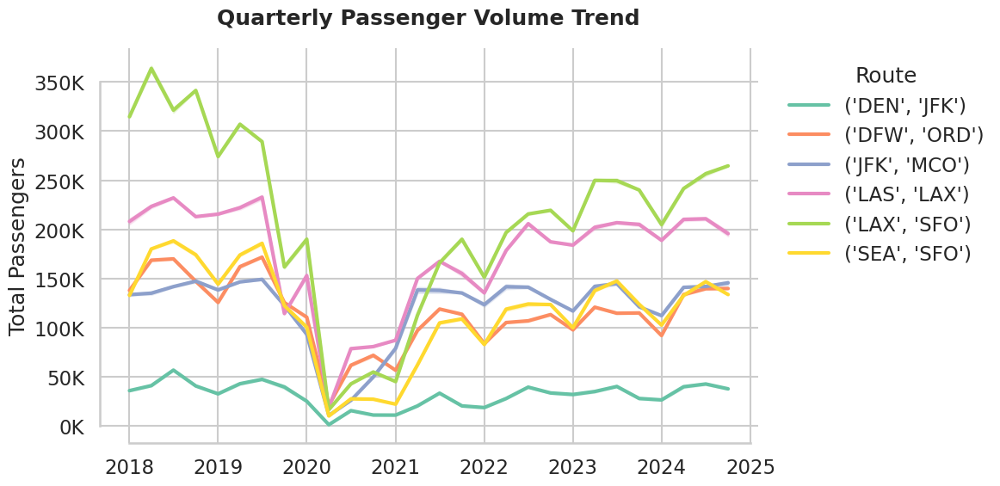

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
import seaborn as sns
import pandas as pd

# 1. Prepare Data
# Scale up DB1B data (10% sample -> Real Estimate)
plot_df = df_total_passengers.copy()
plot_df['Real_Passengers'] = plot_df['TotalPassengers'] * 10

# 2. Setup Style: Using 'Set2' palette to match the previous plot
sns.set_theme(style='whitegrid', palette='Set2', context='talk')

plt.figure(figsize=(12, 6))

# 3. Draw Plot
# marker=None removes the dots for a smooth, minimalist line
ax = sns.lineplot(
    x="TimePoint",
    y="Real_Passengers",
    hue="OD_pair",
    data=plot_df,
    linewidth=3,
    marker=None
)

# 4. Format X-Axis (Clean Dates)
# Only show the Year (2018, 2019...)
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# 5. Format Y-Axis
# Use 'K' notation (e.g., 300K) for cleaner numbers
def format_k(x, pos):
    return f'{int(x/1000)}K'

ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_k))
ax.set_ylabel("Total Passengers")
ax.set_xlabel("")

# 6. Final Layout
ax.set_title("Quarterly Passenger Volume Trend", weight='bold', pad=20)

# Remove top and right borders
sns.despine(trim=True)

# Legend placement
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', frameon=False, title="Route")

plt.tight_layout()
plt.show()
plt.close()

## do a correlation analysis between the cutomer number and ticket price

In [ ]:
od_pairs = [
    ("LAX", "LAS"),
    ("DEN", "JFK"),
    ("ORD", "DFW"),
    ("LAX", "SFO"),
    ("JFK", "MCO"),
    ("SFO", "SEA")
]

In [ ]:
def bidirectional_od_pairs_ticket(df, od_pairs):
    # 1. Normalize the target OD pairs (sort them alphabetically)
    normalized_target_pairs = set(tuple(sorted(pair)) for pair in od_pairs)

    # 2. Create a working copy
    local_df = df.copy()

    # Ensure Year and Quarter are integers
    local_df["Year"] = local_df["Year"].astype(int)
    local_df["Quarter"] = local_df["Quarter"].astype(int)

    # 3. Create the 'OD_pair' column BEFORE grouping
    # This allows us to merge directions (JFK->LAX and LAX->JFK become one group)
    local_df['OD_pair'] = local_df.apply(
        lambda row: tuple(sorted((row['Origin'], row['Dest']))),
        axis=1
    )

    # 4. Filter: Keep only the routes we want
    filtered_df = local_df[local_df['OD_pair'].isin(normalized_target_pairs)].copy()

    # 5. Aggregate: Calculate Mean Fare per Quarter per Bidirectional Pair
    quarterly_avg = (
        filtered_df.groupby(["Year", "Quarter", "OD_pair"])["MktFare"]
        .mean()
        .reset_index()
    )

    # Rename to AvgFare
    quarterly_avg.rename(columns={'MktFare': 'AvgFare'}, inplace=True)

    # 6. Create TimePoint for plotting (Start of the Quarter)
    # Logic: Q1->Month 1, Q2->Month 4, etc.
    quarterly_avg['TimePoint'] = pd.to_datetime(
        quarterly_avg['Year'].astype(str) + '-' +
        (quarterly_avg['Quarter'] * 3 - 2).astype(str) + '-01'
    )

    return quarterly_avg

# --- Usage ---
# Use the cleaned dataframe (the one with outliers removed/non-stop only)
df_average_price = bidirectional_od_pairs_ticket(df, od_pairs)

print(df_average_price.head())

   Year  Quarter     OD_pair     AvgFare  TimePoint
0  2018        1  (DEN, JFK)  199.094498 2018-01-01
1  2018        1  (DFW, ORD)  188.449699 2018-01-01
2  2018        1  (JFK, MCO)  188.481438 2018-01-01
3  2018        1  (LAS, LAX)  120.904484 2018-01-01
4  2018        1  (LAX, SFO)  126.541044 2018-01-01


In [ ]:
def bidirectional_od_pairs_ticket(df, od_pairs):
    # 1. Prepare Target Pairs (Sort them alphabetically to ignore direction)
    normalized_target_pairs = set(tuple(sorted(pair)) for pair in od_pairs)

    # 2. Create a working copy
    df = df.copy()

    # Ensure Year/Quarter are integers
    df["Year"] = df["Year"].astype(int)
    df["Quarter"] = df["Quarter"].astype(int)

    # 3. Create Normalized Route Column on the RAW data
    # We do this BEFORE grouping to ensure a mathematically correct weighted average
    # Note: Using Capitalized 'Origin' and 'Dest' to match your cleaned data
    df['normalized_pair'] = df.apply(
        lambda row: tuple(sorted((row['Origin'], row['Dest']))),
        axis=1
    )

    # 4. Filter First (Efficiency Optimization)
    # Only keep the routes we want to analyze
    df_filtered = df[df['normalized_pair'].isin(normalized_target_pairs)].copy()

    # 5. Aggregate
    # Now we calculate the mean MktFare for the combined bidirectional data
    df_average_price = (
        df_filtered.groupby(["Year", "Quarter", "normalized_pair"])["MktFare"]
        .mean()
        .reset_index()
    )

    # Rename column
    df_average_price.rename(columns={'MktFare': 'AvgFare'}, inplace=True)

    # 6. Time Series Formatting
    # Create TimePoint (Start of the Quarter)
    df_average_price['TimePoint'] = pd.to_datetime(
        df_average_price['Year'].astype(str) + '-' +
        (df_average_price['Quarter'] * 3 - 2).astype(str) + '-01'
    )

    # Create readable string label for the plot (e.g., "JFK-LAX")
    df_average_price['OD_pair'] = df_average_price['normalized_pair'].apply(
        lambda x: f"{x[0]}-{x[1]}"
    )

    # Cleanup
    df_average_price = df_average_price.drop(columns=['Year', 'Quarter', 'normalized_pair'])

    return df_average_price

In [ ]:
df_ticket_avg = bidirectional_od_pairs_ticket(df, od_pairs)


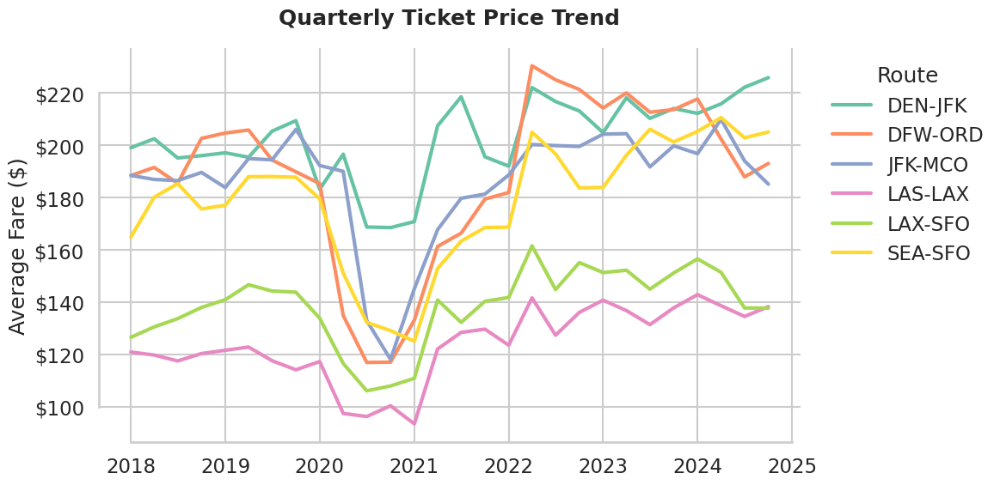

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
import seaborn as sns
import pandas as pd

# 1. Setup Style: Using 'Set2' palette as requested
sns.set_theme(style='whitegrid', palette='Set2', context='talk')

plt.figure(figsize=(12, 6))

# 2. Draw Plot
# marker=None removes the dots (nodes) for a cleaner look
ax = sns.lineplot(
    x="TimePoint",
    y="AvgFare",
    hue="OD_pair",
    data=df_ticket_avg,
    linewidth=3,
    marker=None
)

# 3. Format X-Axis (Clean Dates)
# Only show the Year (2018, 2019...) to avoid overcrowding
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# 4. Format Y-Axis
# Add dollar sign ($) and remove decimals
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('$%.0f'))
ax.set_ylabel("Average Fare ($)")
ax.set_xlabel("")

# 5. Final Layout
ax.set_title("Quarterly Ticket Price Trend", weight='bold', pad=20)

# Remove top and right borders for a minimalist look
sns.despine(trim=True)

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', frameon=False, title="Route")

plt.tight_layout()
plt.show()
plt.close()

In [ ]:
# 1. Standardize the Merge Key (Route Name)
# Convert tuple keys in passenger data to string "Origin-Dest" to match ticket data
df_total_passengers['OD_Str'] = df_total_passengers['OD_pair'].apply(
    lambda x: f"{x[0]}-{x[1]}" if isinstance(x, tuple) else x
)

# Ensure ticket data uses the same string format (if not already)
df_ticket_avg['OD_Str'] = df_ticket_avg['OD_pair'].apply(
    lambda x: f"{x[0]}-{x[1]}" if isinstance(x, tuple) else x
)

# 2. Extract only useful columns
df_vol = df_total_passengers[['TimePoint', 'OD_Str', 'TotalPassengers']].copy()
df_price = df_ticket_avg[['TimePoint', 'OD_Str', 'AvgFare']].copy()

# 3. Merge into one dataframe
df_corr = pd.merge(
    df_vol,
    df_price,
    on=['TimePoint', 'OD_Str'],
    how='inner'
)

print("Merged Data Sample:")
print(df_corr.head())

# 4. Compute Correlation for each OD pair
# We expect a negative correlation (Price up -> Demand down)
results = (
    df_corr
    .groupby('OD_Str')
    .apply(lambda g: g['TotalPassengers'].corr(g['AvgFare']))
    .reset_index(name='Correlation_Coefficient')
)

print("\nCorrelation Analysis Results (Price vs. Volume):")
print(results)


NameError: name 'df_total_passengers' is not defined

Correlation Matrix:
                 TotalPassengers   AvgFare
TotalPassengers         1.000000 -0.325694
AvgFare                -0.325694  1.000000


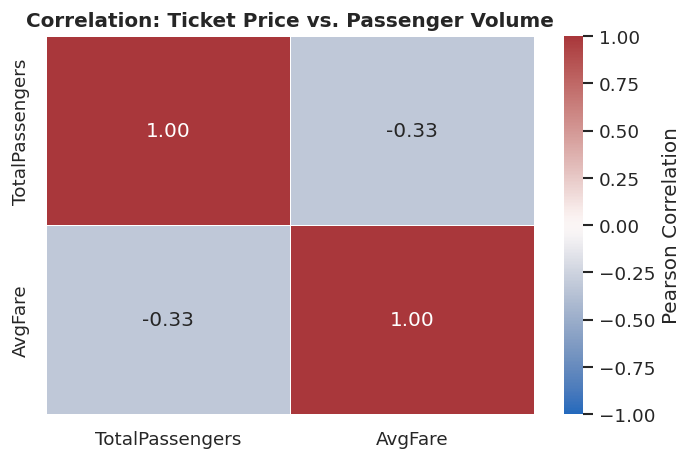

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Calculate the Correlation Matrix (Price vs. Volume)
# We select only the numeric columns relevant to the analysis
corr_matrix = df_corr[['TotalPassengers', 'AvgFare']].corr()

print("Correlation Matrix:")
print(corr_matrix)

# 2. Plot Heatmap
plt.figure(figsize=(6, 4), dpi=120)
sns.set_theme(style='white')

sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    linewidths=.5,
    cmap='vlag', # Diverging colormap (Blue=Negative, Red=Positive)
    vmin=-1, vmax=1, # Fix range to -1 to 1 for correct color scaling
    cbar_kws={'label': 'Pearson Correlation'}
)

plt.title("Correlation: Ticket Price vs. Passenger Volume", weight='bold')
plt.tight_layout()
plt.show()
plt.close()

Current columns in results: Index(['OD_Str', 'Correlation_Coefficient'], dtype='object')
Using Route Column: OD_Str
Using Value Column: Correlation_Coefficient


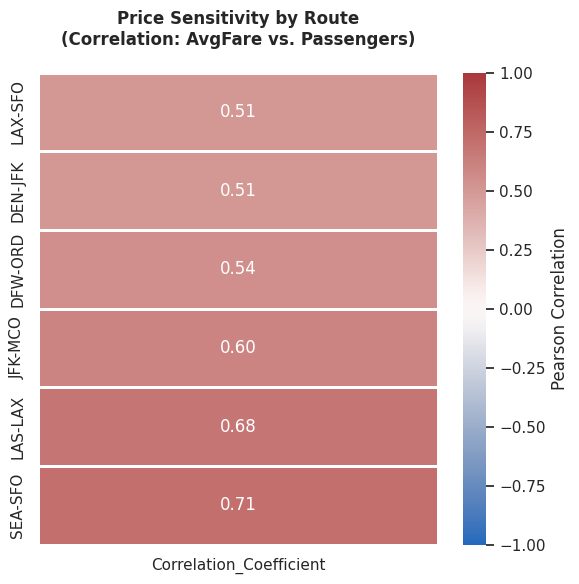

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 1. Check columns to avoid KeyError
print("Current columns in results:", results.columns)

# 2. Identify the correct column names based on previous steps
# The route column is likely index 0, and correlation value is index 1
route_col = results.columns[0]  # Likely 'OD_Str' or 'Merge_Key'
corr_col = results.columns[1]   # Likely 'Correlation_Coefficient' or 'corr_passenger_fare'

print(f"Using Route Column: {route_col}")
print(f"Using Value Column: {corr_col}")

# 3. Prepare Data for Heatmap
# Sort by correlation strength for better visualization
heatmap_data = results.set_index(route_col)[[corr_col]].sort_values(by=corr_col)

# 4. Setup Plot
# Dynamic height based on number of routes
plt.figure(figsize=(6, max(6, len(results) * 0.5)), dpi=100)
sns.set_theme(style='white')

# 5. Draw Heatmap
sns.heatmap(
    heatmap_data,
    annot=True,         # Show numbers
    fmt=".2f",          # 2 decimal places
    cmap='vlag',        # Red-Blue diverging palette (Blue=Negative, Red=Positive)
    center=0,           # White at 0
    vmin=-1, vmax=1,    # Fix scale (-1 to 1)
    cbar_kws={'label': 'Pearson Correlation'},
    linewidths=1,
    linecolor='white'
)

# 6. Formatting
plt.title("Price Sensitivity by Route\n(Correlation: AvgFare vs. Passengers)", weight='bold', pad=20)
plt.ylabel("")
plt.xlabel("")

plt.tight_layout()
plt.show()
plt.close()

# Analysis using SARIMA

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from datetime import timedelta
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import pandas as pd


def perform_sarima_forecasting(df, od_pair_name, forecast_periods=4):
    """
    Fits a SARIMA model and plots the forecast.
    """
    print(f"\n--- SARIMA Analysis for {od_pair_name} ---")

    # 1. Filter Data for the specific route
    # Ensure we strictly copy the data to avoid SettingWithCopy warnings
    ts = df[df['OD_pair'] == od_pair_name].copy()

    # Check if data exists
    if ts.empty:
        print(f"Error: No data found for route {od_pair_name}")
        return

    # Set index to TimePoint and sort
    ts = ts.set_index('TimePoint')['AvgFare'].sort_index()

    # Resample to Quarter Start ('QS') to ensure continuous timeline
    ts = ts.resample('QS').mean().dropna()

    # 2. Decompose (Visualize Trend/Seasonality)
    # Requires at least 2 full cycles (8 quarters)
    if len(ts) >= 8:
        plt.figure(figsize=(10, 6))
        decomposition = seasonal_decompose(ts, model='additive', period=4)
        decomposition.plot()
        plt.suptitle(f'Time Series Decomposition: {od_pair_name}', y=1.02)
        plt.show()
        plt.close()
    else:
        print("Skipping decomposition: Not enough data points.")

    # 3. Fit SARIMA Model
    # Order (1,0,1) x (1,1,1,4) is standard for quarterly data
    try:
        model = SARIMAX(
            ts,
            order=(1, 1, 1),             # Non-seasonal (p,d,q)
            seasonal_order=(1, 1, 0, 4), # Seasonal (P,D,Q,s)
            enforce_stationarity=False,
            enforce_invertibility=False
        )

        results = model.fit(disp=False)
        print(results.summary().tables[1]) # Print only the coefficient table

        # 4. Generate Forecast
        forecast = results.get_forecast(steps=forecast_periods)
        forecast_df = forecast.conf_int()
        forecast_df['Forecast'] = forecast.predicted_mean

        # Dynamic column renaming for confidence intervals
        # (Handles cases where columns are 'lower y'/'upper y')
        forecast_df.columns = ['lower', 'upper', 'Forecast']

        # 5. Plotting
        plt.figure(figsize=(12, 6))
        sns.set_theme(style='whitegrid', context='talk')

        # Historical Data
        plt.plot(ts.index, ts, label='Historical', marker='o', linewidth=2, color='#2b7bba')

        # Forecast Data
        plt.plot(forecast_df.index, forecast_df['Forecast'], label='Forecast',
                 marker='o', linestyle='--', color='#d62728')

        # Confidence Interval (The "Cone of Uncertainty")
        plt.fill_between(
            forecast_df.index,
            forecast_df['lower'],
            forecast_df['upper'],
            color='#d62728',
            alpha=0.15,
            label='95% Confidence Interval'
        )

        # Formatting
        plt.title(f'SARIMA Forecast: {od_pair_name} (Next {forecast_periods} Quarters)', weight='bold')
        plt.ylabel("Average Fare ($)")
        plt.xlabel("")
        plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('$%.0f'))

        plt.legend(loc='upper left')
        sns.despine()
        plt.tight_layout()
        plt.show()
        plt.close()

    except Exception as e:
        print(f"SARIMA fitting failed for {od_pair_name}: {e}")

# --- Example Usage ---
# Assuming df_ticket_avg is the dataframe from the previous step
# perform_sarima_forecasting(df_ticket_avg, "JFK-LAX")

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Function 3: Perform SARIMA Forecasting

def perform_sarima_forecasting(series_data, od_pair_name, forecast_periods=4):
    """
    Fits a SARIMA model to a single time series and plots the forecast.

    Args:
        series_data (pd.Series): The time series data (e.g., AvgFare or TotalPassengers).
        od_pair_name (str): Name of the O-D pair for plot title.
        forecast_periods (int): Number of future quarters to forecast.
    """
    print(f"\n--- SARIMA Analysis for {od_pair_name} ---")

    ts = series_data.set_index('TimePoint')['AvgFare'].sort_index()

    # Resample to quarterly start, taking the mean of all values within each quarter
    ts = ts.resample('QS').mean()

    # Drop missing values caused by resampling
    ts = ts.dropna()

    # 1. Decompose the series to visualize trend and seasonality
    # Note: additive decomposition is typically suitable for economic/fare data
    decomposition = seasonal_decompose(ts, model='additive', period=4)

    plt.figure(figsize=(10, 8))
    decomposition.plot()
    plt.suptitle(f'Time Series Decomposition for {od_pair_name} AvgFare', y=1.02)
    plt.tight_layout()
    plt.show()
    plt.close()

    # 2. Fit the SARIMA model: SARIMA(p,d,q)x(P,D,Q,s)
    # Using a sample model: (1, 0, 1) x (1, 1, 1, 4)
    # The seasonal difference (D=1) and seasonal period (s=4) are key for quarterly data.

    # Check if we have enough data points (SARIMA is data-hungry)
    if len(ts) < 8:
        print(f"Warning: Only {len(ts)} data points available. SARIMA fit may be unstable.")

    try:
        model = SARIMAX(
            ts,
            order=(1, 0, 1),        # Non-seasonal orders (p, d, q)
            seasonal_order=(1, 1, 1, 4), # Seasonal orders (P, D, Q, s=4)
            enforce_stationarity=False,
            enforce_invertibility=False
        )

        results = model.fit(disp=False)
        print(results.summary())

        # 3. Generate Forecast
        # Start the forecast immediately after the end of the training data
        start_date = ts.index[-1] + timedelta(days=1)
        end_date = ts.index[-1] + timedelta(days=90) * forecast_periods

        # Predict uses the last date in the index, forecast continues from there
        forecast = results.get_forecast(steps=forecast_periods)

        # Create a DataFrame for the forecast results
        forecast_df = forecast.conf_int()
        forecast_df['Forecast'] = forecast.predicted_mean

        # 4. Plotting the results
        plt.figure(figsize=(12, 6))
        plt.plot(ts, label='Historical Data', marker='o', color='blue')
        plt.plot(forecast_df['Forecast'], label=f'{forecast_periods}-Quarter Forecast', marker='o', color='red')
        plt.fill_between(
            forecast_df.index,
            forecast_df['lower AvgFare'],
            forecast_df['upper AvgFare'],
            color='pink',
            alpha=0.3,
            label='95% Confidence Interval'
        )

        plt.title(f'SARIMA Forecast (p=1,d=0,q=1)x(P=1,D=1,Q=1,s=4) for {od_pair_name} AvgFare')
        plt.xlabel("Time (Quarterly)")
        plt.ylabel("Average Market Fare")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
        plt.close()

    except Exception as e:
        print(f"SARIMA model fitting failed for {od_pair_name}: {e}")
        # Note: With limited mock data, fitting can fail easily.



In [ ]:
od_pairs = [
    ("LAX", "LAS"),
    ("DEN", "JFK"),
    ("ORD", "DFW"),
    ("LAX", "SFO"),
    ("JFK", "MCO"),
    ("SFO", "SEA"),
]


--- SARIMA Analysis for JFK-MCO ---


<Figure size 1000x800 with 0 Axes>

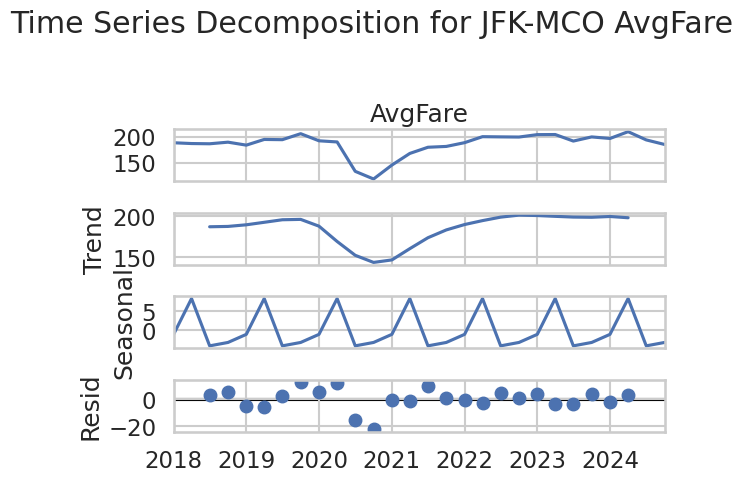

                                     SARIMAX Results                                     
Dep. Variable:                           AvgFare   No. Observations:                   28
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 4)   Log Likelihood                 -77.580
Date:                           Sat, 13 Dec 2025   AIC                            165.159
Time:                                   02:35:49   BIC                            169.611
Sample:                               01-01-2018   HQIC                           165.773
                                    - 10-01-2024                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5862      0.410      1.431      0.152      -0.217       1.389
ma.L1          0.5475      0.365      1.501

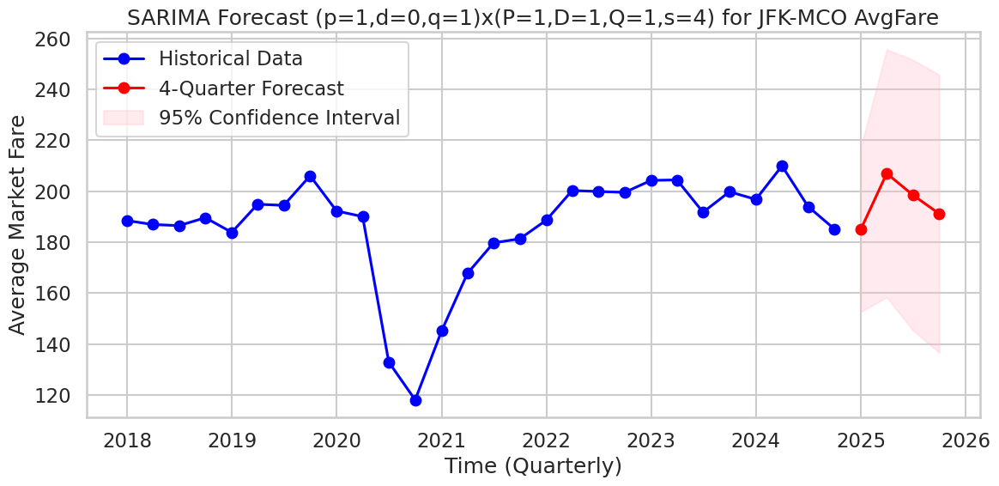

In [ ]:
#SARIMA FORECASTING
# Filter data to get a single time series for SARIMA
series_to_forecast = df_ticket_avg[df_ticket_avg['OD_pair'] == 'JFK-MCO']

if not series_to_forecast.empty:
    perform_sarima_forecasting(series_to_forecast, 'JFK-MCO', forecast_periods=4)
else:
    print("\nCannot run SARIMA: JFK-LAX time series is empty after aggregation.")


In [ ]:
#SARIMA FORECASTING
series_to_forecast = df_ticket_avg[df_ticket_avg['OD_pair'] == 'LAX-LAS']

if not series_to_forecast.empty:
    perform_sarima_forecasting(series_to_forecast, 'LAX-LAS', forecast_periods=4)
else:
    print("\nCannot run SARIMA: LAX-LAS time series is empty after aggregation.")


Cannot run SARIMA: LAX-LAS time series is empty after aggregation.


In [ ]:
#SARIMA FORECASTING
series_to_forecast = df_ticket_avg[df_ticket_avg['OD_pair'] == 'ORD-DFW']

if not series_to_forecast.empty:
    perform_sarima_forecasting(series_to_forecast, 'ORD-DFW', forecast_periods=4)
else:
    print("\nCannot run SARIMA: JFK-LAX time series is empty after aggregation.")

In [ ]:
df.columns

Index(['ItinID', 'MKT_ID', 'MktCoupons', 'Year', 'Quarter', 'OriginAirportID',
       'Origin', 'ORIGIN_STATE_ABR', 'DestAirportID', 'Dest', 'DEST_STATE_ABR',
       'OP_CARRIER_GROUP', 'OPERATING_CARRIER', 'Passengers', 'MktFare',
       'MktDistance', 'MARKET_MILES_FLOWN', 'origin', 'dest',
       'TK_CARRIER_GROUP', 'TkCarrier', 'Route', 'random_date'],
      dtype='object')

# HHI

In [ ]:
import pandas as pd
import numpy as np

# HHI CALCULATION 

# 1. Define the Market Keys for Grouping
# HHI is calculated for a specific market (Time + Route), using the correct column names.
MARKET_KEYS = ['Year', 'Quarter', 'Origin', 'Dest']

# Calculating Carrier Market Share and HHI Index (Optimized)

# 2. Calculate the total number of passengers for the entire market (by MARKET_KEYS).
# 'transform' calculates the market total for every row.
df['Total_Market_Passengers'] = df.groupby(MARKET_KEYS)['Passengers'].transform('sum')

# 3. Calculate total passengers carried by each carrier within each market.
# NOTE: The carrier column used for HHI must be the OPERATING_CARRIER,
# which we assume is available in df after the initial merge/rename steps.
carrier_passengers = df.groupby(MARKET_KEYS + ['TkCarrier'])['Passengers'].sum().reset_index()

# 4. Merge the total market size back to the carrier summary.
market_totals = df[MARKET_KEYS + ['Total_Market_Passengers']].drop_duplicates()
market_share_df = pd.merge(carrier_passengers, market_totals, on=MARKET_KEYS, how='left')


# 5. Calculate Market Share (Share) and Share Squared (Share_Sq)
market_share_df['Share'] = market_share_df['Passengers'] / market_share_df['Total_Market_Passengers']
market_share_df['Share_Sq'] = market_share_df['Share'] ** 2


# Calculating HHI Index

# 6. Sum the squared shares to get HHI (unstandardized).
hhi_df = market_share_df.groupby(MARKET_KEYS)['Share_Sq'].sum().reset_index()
hhi_df.rename(columns={'Share_Sq': 'HHI_Index'}, inplace=True)

# 7. Standardize HHI to the 0-10000 range.
hhi_df['HHI_Index'] = hhi_df['HHI_Index'] * 10000
hhi_df.fillna(0, inplace=True)


# 8. Merge HHI back to the main DataFrame (df)

# 1. Drop the old HHI_Index column from df if it exists.
if 'HHI_Index' in df.columns:
    df.drop(columns=['HHI_Index'], inplace=True)

# Drop the temporary auxiliary column from the main DataFrame before merging.
if 'Total_Market_Passengers' in df.columns:
    df.drop(columns=['Total_Market_Passengers'], inplace=True)

# 2. Merge the calculated HHI_Index back into the main DataFrame (df).
df = pd.merge(df, hhi_df, on=MARKET_KEYS, how='left')

print(df[['Year', 'Quarter', 'Origin', 'Dest', 'HHI_Index']].head())

   Year  Quarter Origin Dest   HHI_Index
0  2018        1    DEN  JFK  5801.58315
1  2018        1    DEN  JFK  5801.58315
2  2018        1    DEN  JFK  5801.58315
3  2018        1    DEN  JFK  5801.58315
4  2018        1    DEN  JFK  5801.58315


   Year  Quarter Origin Dest   HHI_Index
0  2018        1    DEN  JFK  5801.58315
1  2018        1    DEN  JFK  5801.58315
2  2018        1    DEN  JFK  5801.58315
3  2018        1    DEN  JFK  5801.58315
4  2018        1    DEN  JFK  5801.58315


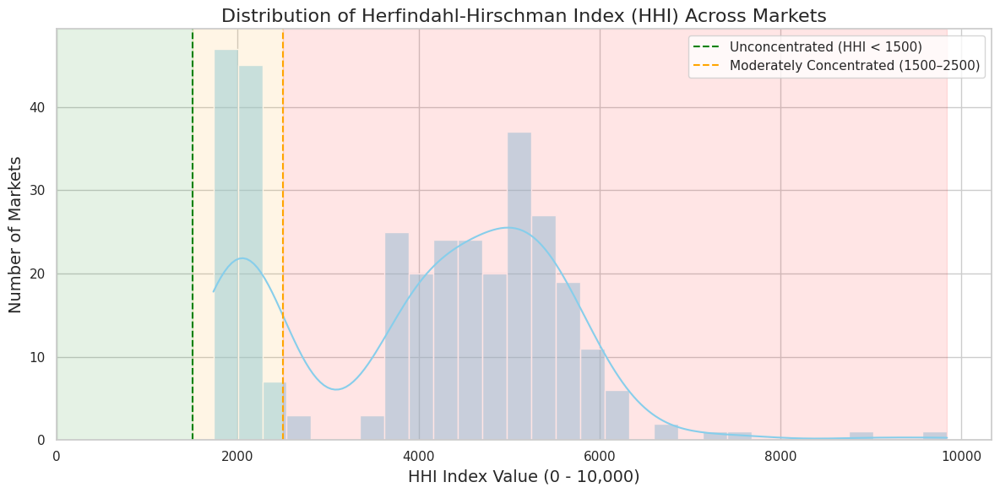


--- HHI Index Key Statistics (Market-Level) ---
count     324.000000
mean     4002.674139
std      1498.771711
min      1731.714877
25%      2167.900198
50%      4379.899767
75%      5165.893120
max      9841.280000

--- HHI Concentration Breakdown (DOJ 1500/2500 Thresholds) ---
Unconcentrated (HHI < 1500): 0 markets (0.0%)
Moderately Concentrated (1500–2500): 97 markets (29.94%)
Highly Concentrated (HHI > 2500): 227 markets (70.06%)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. SETTINGS


# Columns that define a "market" (time + route)
MARKET_KEYS = ['Year', 'Quarter', 'Origin', 'Dest']

# Column containing the operating carrier
# (you said TkCarrier is the actual OperatingCarrier in your data)
CARRIER_COL = 'TkCarrier'

# 2. COMPUTE HHI AT THE MARKET LEVEL


# Step 1: Compute the total number of passengers in each market
# Result: Series indexed by (Year, Quarter, Origin, Dest) with total passengers
market_total = (
    df.groupby(MARKET_KEYS)['Passengers']
      .sum()
      .rename('Total_Market_Pax')
)

# Step 2: Compute total passengers per carrier within each market
# Result: Series indexed by (Year, Quarter, Origin, Dest, Carrier) with carrier passengers
carrier_total = (
    df.groupby(MARKET_KEYS + [CARRIER_COL])['Passengers']
      .sum()
      .rename('Carrier_Pax')
)

# Step 3: Build a clean DataFrame with carrier-level market shares
# We merge carrier totals with market totals using the market keys
market_share_df = (
    carrier_total.reset_index()
    .merge(market_total.reset_index(), on=MARKET_KEYS, how='left')
)

# Step 4: Compute market share and squared market share
market_share_df['Share'] = (
    market_share_df['Carrier_Pax'] / market_share_df['Total_Market_Pax']
)
market_share_df['Share_Sq'] = market_share_df['Share'] ** 2

# Step 5: Compute HHI = sum of squared shares * 10,000 for each market
hhi_df = (
    market_share_df.groupby(MARKET_KEYS)['Share_Sq']
    .sum()
    .mul(10000)  # scale to the [0, 10,000] range commonly used in antitrust analysis
    .rename('HHI_Index')
    .reset_index()
)

# Step 6: Merge the HHI back into the main DataFrame
# This attaches the same HHI value to every row that belongs to the same market.
# We drop any existing HHI_Index column first to avoid suffixes like HHI_Index_x / HHI_Index_y.
if 'HHI_Index' in df.columns:
    df = df.drop(columns=['HHI_Index'])

df = df.merge(hhi_df, on=MARKET_KEYS, how='left')

# Optional: preview the key columns
print(df[['Year', 'Quarter', 'Origin', 'Dest', 'HHI_Index']].head())


# 3. PREPARE UNIQUE MARKET-LEVEL HHI VALUES FOR ANALYSIS

# Each market (Year, Quarter, Origin, Dest) has a single HHI value.
# We drop duplicates to get one row per market.
hhi_values = df[['Year', 'Quarter', 'Origin', 'Dest', 'HHI_Index']].drop_duplicates()

# Drop missing values (if any) for plotting and statistics
plot_data = hhi_values['HHI_Index'].dropna()



# 4. PLOT THE DISTRIBUTION OF HHI ACROSS MARKETS
#     Using DOJ-style thresholds: 1500 / 2500


# Set visual style for the plot
sns.set_style("whitegrid")

# Create the figure and axis
plt.figure(figsize=(12, 6))

# Histogram with kernel density estimate (KDE)
ax = sns.histplot(plot_data, bins=30, kde=True, color='skyblue')

# DOJ merger guideline thresholds (commonly used):
#   HHI < 1500      : unconcentrated
#   1500 ≤ HHI < 2500: moderately concentrated
#   HHI ≥ 2500      : highly concentrated
ax.axvline(1500, color='green', linestyle='--', linewidth=1.5,
           label='Unconcentrated (HHI < 1500)')
ax.axvline(2500, color='orange', linestyle='--', linewidth=1.5,
           label='Moderately Concentrated (1500–2500)')

# Highlight the three concentration zones with semi-transparent colors
max_hhi = plot_data.max()

# Unconcentrated region
ax.axvspan(0, 1500, color='green', alpha=0.1)

# Moderately concentrated region
ax.axvspan(1500, 2500, color='orange', alpha=0.1)

# Highly concentrated region
ax.axvspan(2500, max_hhi, color='red', alpha=0.1)

# Set title and axis labels
plt.title('Distribution of Herfindahl-Hirschman Index (HHI) Across Markets', fontsize=16)
plt.xlabel('HHI Index Value (0 - 10,000)', fontsize=14)
plt.ylabel('Number of Markets', fontsize=14)

# Add legend and adjust x-axis limit
plt.legend(loc='upper right')
plt.xlim(0, max_hhi * 1.05)

# Make layout tight so labels are not cut off
plt.tight_layout()

# Show the plot
plt.show()



# 5. SUMMARY STATISTICS FOR HHI


print("\n--- HHI Index Key Statistics (Market-Level) ---")
print(plot_data.describe().to_string())


# 6. BREAKDOWN BY CONCENTRATION CATEGORY (1500 / 2500)


# Define bins and labels consistent with DOJ-style thresholds
bins = [0, 1500, 2500, np.inf]
labels = [
    'Unconcentrated (HHI < 1500)',
    'Moderately Concentrated (1500–2500)',
    'Highly Concentrated (HHI > 2500)'
]

# Work on a copy to avoid modifying hhi_values in place elsewhere
hhi_values = hhi_values.copy()
hhi_values['Concentration_Level'] = pd.cut(
    hhi_values['HHI_Index'],
    bins=bins,
    labels=labels,
    right=False  # intervals are [0,1500), [1500,2500), [2500, ∞)
)

# Count and percentage of markets in each concentration category
count_table = hhi_values['Concentration_Level'].value_counts().sort_index()
share_table = (
    hhi_values['Concentration_Level']
    .value_counts(normalize=True)
    .sort_index()
    .mul(100)
    .round(2)
)

print("\n--- HHI Concentration Breakdown (DOJ 1500/2500 Thresholds) ---")
for lbl in labels:
    print(f"{lbl}: {count_table.get(lbl, 0)} markets "
          f"({share_table.get(lbl, 0.0)}%)")


# Add extra datasets to help training data

In [ ]:
import pandas as pd
import numpy as np
import gc
from google.colab import drive

# =========================
# 0. Mount Google Drive
# =========================
# drive.mount("/content/drive")

# =========================
# 1. Paths
# =========================
BASE_PATH = "/content/drive/MyDrive/STA141B_Project"
TRAFFIC_PATH = f"{BASE_PATH}/air traffic.csv"
PRICES_PATH = f"{BASE_PATH}/itineraries.csv"

# Optional: save simple lookup tables for later API matching
TRAFFIC_LOOKUP_PATH = f"{BASE_PATH}/traffic_quarterly_lookup_SIMPLE.csv"
ROUTE_LOOKUP_PATH   = f"{BASE_PATH}/route_features_SIMPLE.csv"

print("✅ Simple feature engineering mode (no granular bins)")
print("   -> Traffic:", TRAFFIC_PATH)
print("   -> Expedia:", PRICES_PATH)


# =========================
# 2. Traffic: Year–Quarter level only
# =========================
def process_traffic_simple(df, traffic_path, save_lookup_path=None):
    """
    Add macro US traffic indicators at (Year, Quarter) level:
      - Macro_US_Load_Factor
      - Macro_US_Capacity
      - Macro_US_Demand
    No seasonal backfill tricks beyond simple mean fill.
    """
    print("\n=== [Traffic] Simple Year–Quarter merge ===")

    traffic_df = pd.read_csv(traffic_path)
    traffic_df.columns = traffic_df.columns.str.strip()

    # Month -> Quarter
    quarter_map = {
        1: 1, 2: 1, 3: 1,
        4: 2, 5: 2, 6: 2,
        7: 3, 8: 3, 9: 3,
        10: 4, 11: 4, 12: 4
    }
    traffic_df["Quarter"] = traffic_df["Month"].map(quarter_map)

    # Clean numeric columns (strings with commas)
    for col in ["Dom_ASM", "Dom_RPM", "Dom_LF"]:
        if traffic_df[col].dtype == "O":
            traffic_df[col] = (
                traffic_df[col].astype(str)
                .str.replace(",", "", regex=False)
                .astype("float64")
            )

    # Aggregate at (Year, Quarter)
    traffic_agg = (
        traffic_df
        .groupby(["Year", "Quarter"])
        .agg({
            "Dom_LF": "mean",   # load factor
            "Dom_ASM": "sum",   # capacity
            "Dom_RPM": "sum"    # demand
        })
        .rename(columns={
            "Dom_LF": "Macro_US_Load_Factor",
            "Dom_ASM": "Macro_US_Capacity",
            "Dom_RPM": "Macro_US_Demand"
        })
    )

    print(f"   -> traffic_agg shape: {traffic_agg.shape}")

    if save_lookup_path is not None:
        traffic_agg.to_csv(save_lookup_path)
        print(f"   -> Saved traffic lookup to: {save_lookup_path}")

    # Ensure keys are int
    df["Year"] = df["Year"].astype(int)
    df["Quarter"] = df["Quarter"].astype(int)

    # Drop existing columns if they already exist (avoid overlap on reruns)
    df = df.drop(
        columns=["Macro_US_Load_Factor", "Macro_US_Capacity", "Macro_US_Demand"],
        errors="ignore"
    )

    # Left join on (Year, Quarter)
    df = df.join(traffic_agg, on=["Year", "Quarter"], how="left")

    # Fill remaining NaN with column means (simple and robust)
    for col in ["Macro_US_Load_Factor", "Macro_US_Capacity", "Macro_US_Demand"]:
        if col in df.columns:
            df[col] = df[col].fillna(df[col].mean())

    print("✅ [Traffic] Simple merge done.")
    return df


# =========================
# 3. Expedia: Route-level only (Origin, Dest)
# =========================
def merge_expedia_route_simple(df, prices_csv_path, save_lookup_path=None, debug=True):
    """
    Build simple route-level features from Expedia:
      - Route_Avg_Booking_Days
      - Route_Basic_Econ_Ratio
      - Route_Refundable_Ratio

    Aggregation key: (Origin, Dest) only.
    No Quarter dimension, no booking-window bins.
    """
    print(f"\n=== [Expedia] Simple route-level features (debug={debug}) ===")
    print(f"   -> Reading: {prices_csv_path}")

    use_cols = [
        "searchDate", "flightDate",
        "startingAirport", "destinationAirport",
        "isBasicEconomy", "isRefundable"
    ]

    chunk_size = 200_000
    chunk_stats = []
    chunk_count = 0

    try:
        reader = pd.read_csv(prices_csv_path, usecols=use_cols, chunksize=chunk_size)
    except Exception as e:
        print(f"❌ Failed to open Expedia file: {e}")
        return df

    for chunk in reader:
        chunk_count += 1
        if chunk_count % 5 == 0:
            print(f"   -> processed ~{chunk_count * 0.2:.1f}M rows...")
            gc.collect()

        # 1) Compute days_to_depart
        s_date = pd.to_datetime(chunk["searchDate"], errors="coerce")
        f_date = pd.to_datetime(chunk["flightDate"], errors="coerce")
        chunk["days_to_depart"] = (f_date - s_date).dt.days

        # Keep reasonable range
        chunk = chunk[
            (chunk["days_to_depart"] >= 0) &
            (chunk["days_to_depart"] < 365)
        ]

        # 2) Convert flags to int
        chunk["isBasicEconomy"] = (
            chunk["isBasicEconomy"].astype(str).str.lower() == "true"
        ).astype(int)
        chunk["isRefundable"] = (
            chunk["isRefundable"].astype(str).str.lower() == "true"
        ).astype(int)

        # 3) Aggregate by (Origin, Dest)
        agg_chunk = (
            chunk
            .groupby(["startingAirport", "destinationAirport"])
            .agg({
                "days_to_depart": ["sum", "count"],
                "isBasicEconomy": ["sum", "count"],
                "isRefundable": ["sum", "count"]
            })
            .reset_index()
        )

        chunk_stats.append(agg_chunk)

        if debug and chunk_count >= 10:
            print("🛑 Debug mode: stopping after ~2M rows.")
            break

    if not chunk_stats:
        print("⚠️ No Expedia data collected. Returning original df.")
        return df

    print("   -> Combining chunk-level stats...")
    all_chunks = pd.concat(chunk_stats, ignore_index=True)

    # Rename columns (flatten MultiIndex)
    all_chunks.columns = [
        "Origin", "Dest",
        "days_sum", "days_count",
        "basic_sum", "basic_count",
        "refund_sum", "refund_count"
    ]

    # Aggregate across all chunks
    final_profile = (
        all_chunks
        .groupby(["Origin", "Dest"])
        .sum()
        .reset_index()
    )

    # Avoid division by zero
    final_profile["days_count"]   = final_profile["days_count"].replace(0, 1)
    final_profile["basic_count"]  = final_profile["basic_count"].replace(0, 1)
    final_profile["refund_count"] = final_profile["refund_count"].replace(0, 1)

    # Compute final route-level features
    final_profile["Route_Avg_Booking_Days"] = (
        final_profile["days_sum"] / final_profile["days_count"]
    )
    final_profile["Route_Basic_Econ_Ratio"] = (
        final_profile["basic_sum"] / final_profile["basic_count"]
    )
    final_profile["Route_Refundable_Ratio"] = (
        final_profile["refund_sum"] / final_profile["refund_count"]
    )

    route_features = final_profile[
        ["Origin", "Dest",
         "Route_Avg_Booking_Days",
         "Route_Basic_Econ_Ratio",
         "Route_Refundable_Ratio"]
    ]

    print(f"   -> Built simple Expedia profile for {len(route_features)} routes.")

    if save_lookup_path is not None:
        route_features.to_csv(save_lookup_path, index=False)
        print(f"   -> Saved route lookup to: {save_lookup_path}")

    # Merge into main df
    print("   -> Merging Expedia route features into df...")

    # Clean old versions if any
    df = df.drop(
        columns=[
            "Route_Avg_Booking_Days",
            "Route_Basic_Econ_Ratio",
            "Route_Refundable_Ratio"
        ],
        errors="ignore"
    )

    df = df.merge(route_features, on=["Origin", "Dest"], how="left")

    # Fill missing with means
    for col in [
        "Route_Avg_Booking_Days",
        "Route_Basic_Econ_Ratio",
        "Route_Refundable_Ratio"
    ]:
        if col in df.columns:
            df[col] = df[col].fillna(df[col].mean())

    print("✅ [Expedia] Simple route merge done.")
    return df


# =========================
# 4. Run pipeline
# =========================
if "df" not in locals():
    raise RuntimeError("⚠️ 'df' not found. Please load DB1B data into df first.")

print(f"\n🚀 Starting simple merge pipeline on df shape: {df.shape}")

# 1) Traffic (Year–Quarter)
df = process_traffic_simple(df, TRAFFIC_PATH, save_lookup_path=TRAFFIC_LOOKUP_PATH)

# 2) Expedia (Origin–Dest route)
#    Set debug=False if you want to run on full 31GB file.
df = merge_expedia_route_simple(df, PRICES_PATH, save_lookup_path=ROUTE_LOOKUP_PATH, debug=True)

print("\n🎉 Simple merge complete.")
print("Preview of merged features:")
print(
    df[[
        "Year", "Quarter", "Origin", "Dest",
        "Macro_US_Load_Factor",
        "Route_Avg_Booking_Days",
        "Route_Basic_Econ_Ratio"
    ]].head()
)


✅ Simple feature engineering mode (no granular bins)
   -> Traffic: /content/drive/MyDrive/STA141B_Project/air traffic.csv
   -> Expedia: /content/drive/MyDrive/STA141B_Project/itineraries.csv

🚀 Starting simple merge pipeline on df shape: (987856, 40)

=== [Traffic] Simple Year–Quarter merge ===
   -> traffic_agg shape: (83, 3)
   -> Saved traffic lookup to: /content/drive/MyDrive/STA141B_Project/traffic_quarterly_lookup_SIMPLE.csv
✅ [Traffic] Simple merge done.

=== [Expedia] Simple route-level features (debug=True) ===
   -> Reading: /content/drive/MyDrive/STA141B_Project/itineraries.csv
   -> processed ~1.0M rows...
   -> Combining chunk-level stats...
   -> Built simple Expedia profile for 234 routes.
   -> Saved route lookup to: /content/drive/MyDrive/STA141B_Project/route_features_SIMPLE.csv
   -> Merging Expedia route features into df...
✅ [Expedia] Simple route merge done.

🎉 Simple merge complete.
Preview of merged features:
   Year  Quarter Origin Dest  Macro_US_Load_Factor 

#Multivariable Regression


=== [Analysis] Multivariable Regression (Simple OLS) ===
   -> Using existing Airline column.
   -> Including feature: Macro_US_Load_Factor
   -> Including feature: Route_Avg_Booking_Days
   -> Including feature: Route_Basic_Econ_Ratio
   -> Including feature: HHI_Index
   -> Data ready for OLS. Rows: 900708
   -> Formula: MktFare ~ MktDistance + Passengers + C(Airline) + C(Q_Str) + Is_Covid + Macro_US_Load_Factor + Route_Avg_Booking_Days + Route_Basic_Econ_Ratio + HHI_Index
   -> Running OLS fit...

OLS REGRESSION SUMMARY (Simple Spec)
                            OLS Regression Results                            
Dep. Variable:                MktFare   R-squared:                       0.160
Model:                            OLS   Adj. R-squared:                  0.160
Method:                 Least Squares   F-statistic:                     9566.
Date:                Fri, 12 Dec 2025   Prob (F-statistic):               0.00
Time:                        04:19:41   Log-Likelihood:      

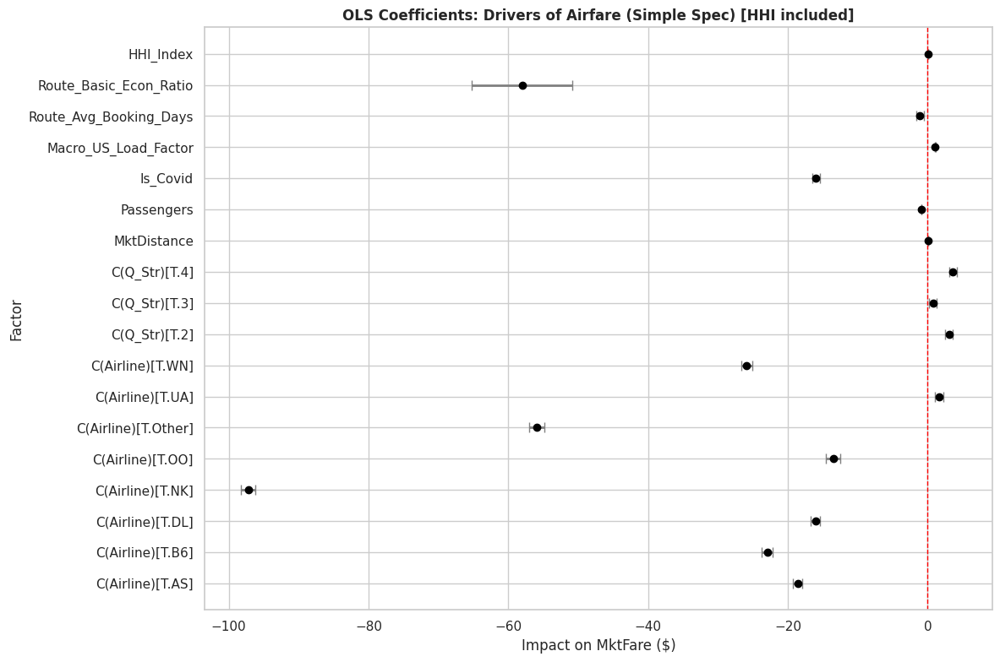

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns

# =========================
# Multivariable Regression (Simple OLS Version)
# =========================
def run_ols_regression(df, include_hhi=True):
    print("\n=== [Analysis] Multivariable Regression (Simple OLS) ===")

    # --- HHI flag ---
    HHI_INCLUDED = include_hhi
    if HHI_INCLUDED and 'HHI_Index' not in df.columns:
        print("⚠️ HHI_Index not found in DataFrame. Disabling HHI for regression.")
        HHI_INCLUDED = False

    # ---------- A. Data Preparation ----------

    # 1) Airline grouping
    if 'Airline' not in df.columns:
        if 'TkCarrier' in df.columns:
            print("   -> Grouping Airlines based on TkCarrier...")
            top_carriers = df['TkCarrier'].value_counts().nlargest(8).index
            df['Airline'] = df['TkCarrier'].apply(
                lambda x: x if x in top_carriers else 'Other'
            )
        else:
            print("⚠️ 'TkCarrier' not found. Using 'Unknown' for Airline.")
            df['Airline'] = 'Unknown'
    else:
        print("   -> Using existing Airline column.")

    # 2) COVID dummy
    if 'Is_Covid' not in df.columns:
        df['Is_Covid'] = df['Year'].apply(lambda x: 1 if x in [2020, 2021] else 0)

    # 3) Quarter as categorical string
    if 'Q_Str' not in df.columns:
        df['Q_Str'] = df['Quarter'].astype(str)

    # ---------- B. Select Columns ----------

    # Base controls
    required_cols = [
        'MktFare',
        'MktDistance',
        'Passengers',
        'Airline',
        'Q_Str',
        'Is_Covid'
    ]

    # Optional extra features: only used if they exist
    optional_features = [
        'Macro_US_Load_Factor',    # from traffic
        'Route_Avg_Booking_Days',  # from Expedia
        'Route_Basic_Econ_Ratio'   # from Expedia
    ]

    for col in optional_features:
        if col in df.columns:
            required_cols.append(col)
            print(f"   -> Including feature: {col}")
        else:
            print(f"   -> Skipping (not found): {col}")

    if HHI_INCLUDED:
        required_cols.append('HHI_Index')
        print("   -> Including feature: HHI_Index")

    # Filter NA
    try:
        df_ols = df[required_cols].dropna().copy()
        print(f"   -> Data ready for OLS. Rows: {len(df_ols)}")
    except KeyError as e:
        print(f"❌ Missing columns for regression: {e}. Skipping OLS.")
        return None

    # ---------- C. Build Formula ----------

    formula_parts = [
        'MktFare ~ MktDistance',
        'Passengers',
        'C(Airline)',  # categorical
        'C(Q_Str)',    # categorical
        'Is_Covid'
    ]

    for col in optional_features:
        if col in df_ols.columns:
            formula_parts.append(col)

    if HHI_INCLUDED:
        formula_parts.append('HHI_Index')

    formula = ' + '.join(formula_parts)
    print(f"   -> Formula: {formula}")

    # ---------- D. Fit OLS ----------

    print("   -> Running OLS fit...")
    model = smf.ols(formula=formula, data=df_ols).fit()

    print("\n" + "="*50)
    print("OLS REGRESSION SUMMARY (Simple Spec)")
    print("="*50)
    print(model.summary())

    # ---------- E. Coefficient Plot ----------

    print("\n   -> Plotting coefficients...")

    results_df = pd.DataFrame({
        'Variable': model.params.index,
        'Coefficient': model.params.values,
        'StdErr': model.bse.values
    })

    # Drop intercept for clarity
    results_df = results_df[results_df['Variable'] != 'Intercept']

    plt.figure(figsize=(12, max(8, len(results_df) * 0.3)))
    sns.set_theme(style="whitegrid")

    plt.errorbar(
        x=results_df['Coefficient'],
        y=results_df['Variable'],
        xerr=1.96 * results_df['StdErr'],
        fmt='o',
        color='black',
        ecolor='gray',
        elinewidth=2,
        capsize=4
    )

    plt.axvline(x=0, color='red', linestyle='--', linewidth=1)
    title = "OLS Coefficients: Drivers of Airfare (Simple Spec)"
    if HHI_INCLUDED:
        title += " [HHI included]"
    plt.title(title, weight='bold')
    plt.xlabel("Impact on MktFare ($)")
    plt.ylabel("Factor")
    plt.tight_layout()
    plt.show()

    return model

# =========================
# Execution
# =========================
if 'df' in locals():
    ols_model = run_ols_regression(df, include_hhi=True)
else:
    print("⚠️ 'df' variable not found in memory. Please load DB1B first.")


# Random Forest


=== [Analysis] Standard Random Forest Model (Direct Price) ===
   -> Preparing data for Random Forest...
   -> Including optional feature: Macro_US_Load_Factor
   -> Including optional feature: Route_Avg_Booking_Days
   -> Including optional feature: Route_Basic_Econ_Ratio
   -> Data ready for RF. Rows: 900708
   -> Training data shape: (720566, 18)

   -> Training Standard Random Forest... (This may take some time)

   -> Evaluating Model Performance...
   -> Model R-squared: 0.224 (explains 22.4% of price variance)
   -> Model RMSE:      $81.67 (average prediction error)

   -> Generating Feature Importance Plot...


/tmp/ipython-input-608723374.py:138: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Importance', y='Feature', data=importances, palette='magma')


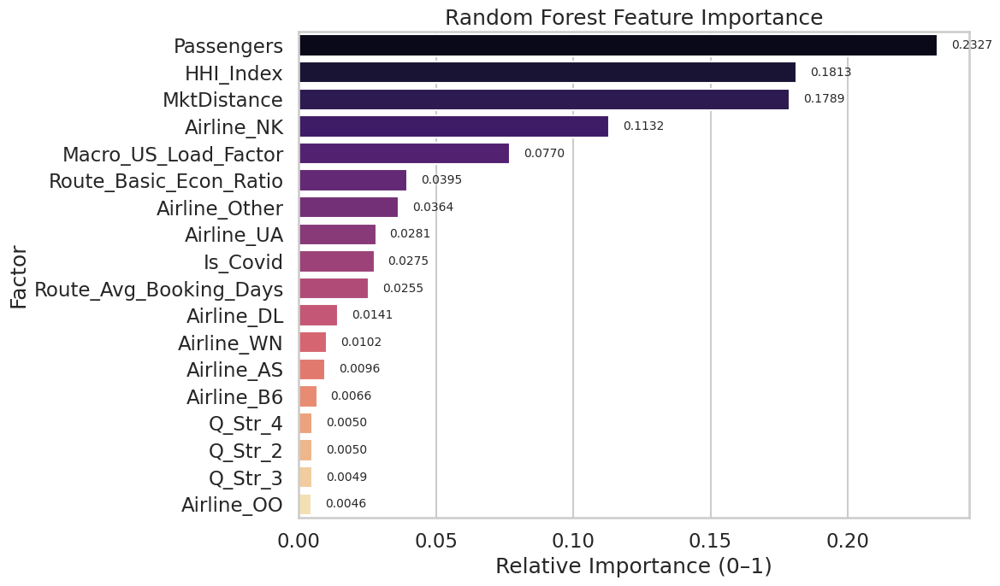

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# =========================
# Analysis: Standard Random Forest Regression
# Focus: Predictive Power (Direct Price Prediction)
# =========================
def run_random_forest_standard(df, include_hhi=True):
    print("\n=== [Analysis] Standard Random Forest Model (Direct Price) ===")

    # --- Control Flag for HHI ---
    HHI_INCLUDED = include_hhi
    if HHI_INCLUDED and 'HHI_Index' not in df.columns:
        print("⚠️ HHI_Index not found in DataFrame. Disabling HHI for RF.")
        HHI_INCLUDED = False

    # --- 1. Data Preparation ---
    print("   -> Preparing data for Random Forest...")

    # Ensure 'Airline' column exists (group top carriers; others labeled as 'Other')
    if 'Airline' not in df.columns:
        if 'TkCarrier' in df.columns:
            # Group top carriers for robust dummy creation
            top_carriers = df['TkCarrier'].value_counts().nlargest(8).index
            df['Airline'] = df['TkCarrier'].apply(
                lambda x: x if x in top_carriers else 'Other'
            )
        else:
            df['Airline'] = 'Unknown'

    # COVID dummy: 1 for 2020–2021, else 0 (based on 'Year' column)
    if 'Is_Covid' not in df.columns:
        df['Is_Covid'] = df['Year'].apply(lambda x: 1 if x in [2020, 2021] else 0)

    # Quarter as string for dummy encoding
    if 'Q_Str' not in df.columns:
        df['Q_Str'] = df['Quarter'].astype(str)

    # Base feature set (core variables for price prediction)
    required_rf_cols = [
        'MktFare',
        'MktDistance',
        'Passengers',
        'Airline',
        'Q_Str',
        'Is_Covid'
    ]

    # Optional macro / Expedia features if available
    optional_features = [
        'Macro_US_Load_Factor',
        'Route_Avg_Booking_Days',
        'Route_Basic_Econ_Ratio'
    ]
    for col in optional_features:
        if col in df.columns:
            required_rf_cols.append(col)
            print(f"   -> Including optional feature: {col}")

    # HHI optional
    if HHI_INCLUDED:
        required_rf_cols.append('HHI_Index')

    # Drop missing rows on selected columns to ensure clean training data
    try:
        rf_model_df = df[required_rf_cols].dropna().copy()
        print(f"   -> Data ready for RF. Rows: {len(rf_model_df)}")
    except KeyError as e:
        print(f"❌ Missing required columns for Random Forest: {e}. Skipping.")
        return None, None

    # One-hot encoding for categorical features
    CATEGORICAL_COLS = ['Airline', 'Q_Str']
    rf_final_df = pd.get_dummies(
        rf_model_df,
        columns=CATEGORICAL_COLS,
        drop_first=True, # Avoid multicollinearity
        dtype=int
    )

    # Target and features setup
    # Target variable: Direct price prediction (no log transform)
    y = rf_final_df['MktFare']
    X = rf_final_df.drop(columns=['MktFare'], errors='ignore')

    # Train-test split: 80% train, 20% test
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    print(f"   -> Training data shape: {X_train.shape}")

    # --- 2. Train Model ---
    print("\n   -> Training Standard Random Forest... (This may take some time)")
    rf_model = RandomForestRegressor(
        n_estimators=200,      # Number of trees
        max_depth=25,          # Maximum tree depth
        min_samples_split=10,  # Minimum samples required to split an internal node
        max_features='sqrt',   # Number of features to consider when looking for the best split
        n_jobs=-1,             # Use all CPU cores for parallel processing
        random_state=42,
        verbose=0
    )

    rf_model.fit(X_train, y_train)

    # --- 3. Evaluate Performance ---
    print("\n   -> Evaluating Model Performance...")
    y_pred = rf_model.predict(X_test)

    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    print(f"   -> Model R-squared: {r2:.3f} (explains {r2*100:.1f}% of price variance)")
    print(f"   -> Model RMSE:      ${rmse:.2f} (average prediction error)")

    # --- 4. Feature Importance Plot ---
    # Generating the feature importance visualization with numerical labels
    print("\n   -> Generating Feature Importance Plot...")
    importances = pd.DataFrame({
        'Feature': X.columns,
        'Importance': rf_model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    # Dynamic figure height based on number of features
    num_features = len(importances)
    fig_height = max(7, num_features * 0.4)

    plt.figure(figsize=(12, fig_height))
    sns.set_theme(style="whitegrid", context="talk")

    # Use the 'magma' palette for the bars
    ax = sns.barplot(x='Importance', y='Feature', data=importances, palette='magma')

    # **PROFESSIONAL ANNOTATION: Add numerical values to the bars**
    for p in ax.patches:
        width = p.get_width()
        # Add the text label to the right of the bar
        ax.text(width + 0.005,  # X coordinate (a little offset from the bar end)
                p.get_y() + p.get_height() / 2., # Y coordinate (center vertically)
                '{:1.4f}'.format(width), # The text format (4 decimal places)
                ha = 'left', # Horizontal alignment
                va = 'center', # Vertical alignment
                fontsize=10) # Font size

    # **USER REQUEST: Use a simple title without R^2/RMSE**
    plot_title = "Random Forest Feature Importance"
    plt.title(plot_title)

    plt.xlabel("Relative Importance (0–1)")
    plt.ylabel("Factor")
    plt.tight_layout()
    plt.show()

    return rf_model, X_train


# =========================
# Execution
# =========================
# Check if the dataframe 'df' is available in the local memory before running
if 'df' in locals():
    # Run Standard Random Forest
    rf_model, X_train = run_random_forest_standard(df, include_hhi=True)
else:
    print("⚠️ 'df' variable not found in memory. Please ensure the data is loaded.")


=== [Analysis] Standard Random Forest Model (Direct Price) ===
   -> Preparing data for Random Forest...
   -> Including feature: Macro_US_Load_Factor
   -> Including feature: Route_Avg_Booking_Days
   -> Including feature: Route_Basic_Econ_Ratio
   -> Data ready for RF. Rows: 900708
   -> Training data shape: (720566, 18)

   -> Training Standard Random Forest... (This will take time)

   -> Evaluating Model Performance...
   -> Model R-squared: 0.224 (explains 22.4% of price variance)
   -> Model RMSE:      $81.67 (average prediction error)

   -> Generating Feature Importance Plot...


/tmp/ipython-input-1692769142.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=importances, palette='magma')


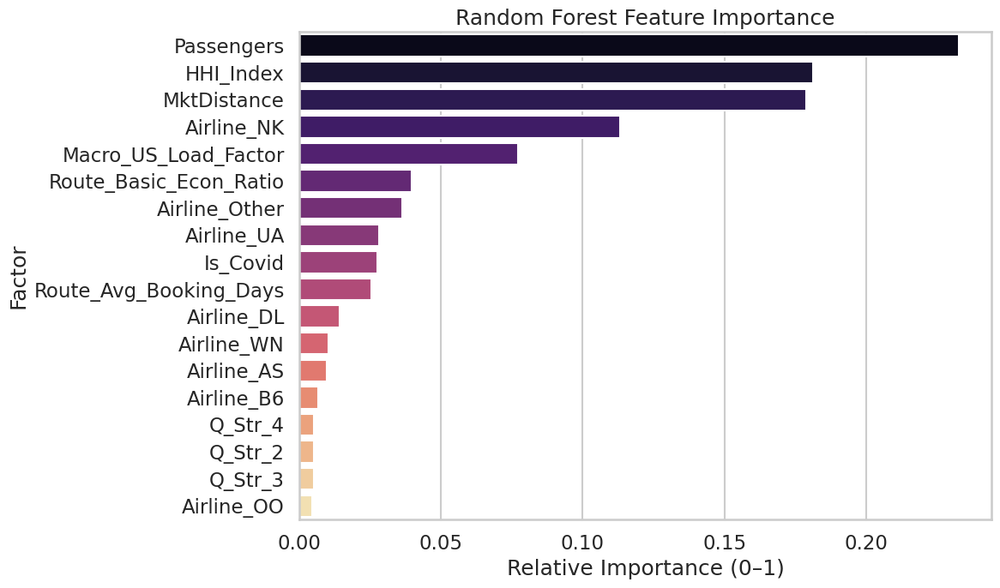

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# =========================
# Analysis: Standard Random Forest Regression
# Focus: Predictive Power (Direct Price Prediction)
# =========================
def run_random_forest_standard(df, include_hhi=True):
    print("\n=== [Analysis] Standard Random Forest Model (Direct Price) ===")

    # --- Control Flag for HHI ---
    HHI_INCLUDED = include_hhi
    if HHI_INCLUDED and 'HHI_Index' not in df.columns:
        print("⚠️ HHI_Index not found in DataFrame. Disabling HHI for RF.")
        HHI_INCLUDED = False

    # --- 1. Data Preparation ---
    print("   -> Preparing data for Random Forest...")

    # Ensure 'Airline' column exists (group top carriers; others labeled as 'Other')
    if 'Airline' not in df.columns:
        if 'TkCarrier' in df.columns:
            # Group top carriers
            top_carriers = df['TkCarrier'].value_counts().nlargest(8).index
            df['Airline'] = df['TkCarrier'].apply(
                lambda x: x if x in top_carriers else 'Other'
            )
        else:
            df['Airline'] = 'Unknown'

    # COVID dummy: 1 for 2020–2021, else 0
    if 'Is_Covid' not in df.columns:
        df['Is_Covid'] = df['Year'].apply(lambda x: 1 if x in [2020, 2021] else 0)

    # Quarter as string for dummy encoding
    if 'Q_Str' not in df.columns:
        df['Q_Str'] = df['Quarter'].astype(str)

    # Base feature set
    required_rf_cols = [
        'MktFare',
        'MktDistance',
        'Passengers',
        'Airline',
        'Q_Str',
        'Is_Covid'
    ]

    # Optional macro / Expedia features if available
    optional_features = [
        'Macro_US_Load_Factor',
        'Route_Avg_Booking_Days',
        'Route_Basic_Econ_Ratio'
    ]
    for col in optional_features:
        if col in df.columns:
            required_rf_cols.append(col)
            print(f"   -> Including feature: {col}")

    # HHI optional
    if HHI_INCLUDED:
        required_rf_cols.append('HHI_Index')

    # Drop missing rows on selected columns
    try:
        rf_model_df = df[required_rf_cols].dropna().copy()
        print(f"   -> Data ready for RF. Rows: {len(rf_model_df)}")
    except KeyError as e:
        print(f"❌ Missing columns for Random Forest: {e}. Skipping.")
        return None, None

    # One-hot encoding for categorical features
    CATEGORICAL_COLS = ['Airline', 'Q_Str']
    rf_final_df = pd.get_dummies(
        rf_model_df,
        columns=CATEGORICAL_COLS,
        drop_first=True,
        dtype=int
    )

    # Target and features
    # Direct price prediction (no log transform)
    y = rf_final_df['MktFare']
    X = rf_final_df.drop(columns=['MktFare'], errors='ignore')

    # Train-test split: 80% train, 20% test
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    print(f"   -> Training data shape: {X_train.shape}")

    # --- 2. Train Model ---
    print("\n   -> Training Standard Random Forest... (This will take time)")
    rf_model = RandomForestRegressor(
        n_estimators=200,      # More trees → more stable
        max_depth=25,          # Allow complex interactions
        min_samples_split=10,
        max_features='sqrt',
        n_jobs=-1,             # Use all CPU cores
        random_state=42,
        verbose=0
    )

    rf_model.fit(X_train, y_train)

    # --- 3. Evaluate Performance ---
    print("\n   -> Evaluating Model Performance...")
    y_pred = rf_model.predict(X_test)

    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    print(f"   -> Model R-squared: {r2:.3f} (explains {r2*100:.1f}% of price variance)")
    print(f"   -> Model RMSE:      ${rmse:.2f} (average prediction error)")

    # --- 4. Feature Importance Plot ---
    print("\n   -> Generating Feature Importance Plot...")
    importances = pd.DataFrame({
        'Feature': X.columns,
        'Importance': rf_model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    # Dynamic figure height based on number of features
    num_features = len(importances)
    fig_height = max(7, num_features * 0.4)

    plt.figure(figsize=(12, fig_height))
    sns.set_theme(style="whitegrid", context="talk")

    sns.barplot(x='Importance', y='Feature', data=importances, palette='magma')

    plt.title(f"Random Forest Feature Importance")
    plt.xlabel("Relative Importance (0–1)")
    plt.ylabel("Factor")
    plt.tight_layout()
    plt.show()

    return rf_model, X_train


# =========================
# Execution
# =========================
if 'df' in locals():
    # Run Standard Random Forest
    rf_model, X_train = run_random_forest_standard(df, include_hhi=True)
else:
    print("⚠️ 'df' variable not found in memory.")

#Map using folium


In [ ]:
!pip install folium

In [ ]:
import folium
m = folium.Map(location = [38.79,-106.53],
               contro_scale = True,
               zoom_control = True,
               zoom_start = 4)

In [ ]:
type(m)

In [ ]:
airports = {
    "LAX": (33.9416, -118.4090),
    "LAS": (36.0800, -115.1522),
    "DEN": (39.8500, -104.6740),
    "JFK": (40.6413, -73.7781),
    "ORD": (41.9742, -87.9073),
    "DFW": (32.8998, -97.0403),
    "SFO": (37.6213, -122.3790),
    "SEA": (47.4502, -122.3088),
    "MCO": (28.4312, -81.3080),
}
# Add airport markers
for code, (lat, lon) in airports.items():
    folium.Marker(
        location=[lat, lon],
        radius = 5,
        fill = True,
        fill_color = 'darkblue',
        popup=code,
        tooltip=code,
        icon=folium.Icon(color="blue", icon="plane", prefix="fa")
    ).add_to(m)

# OD pairs
od_pairs = [
    ("LAX", "LAS"),
    ("DEN", "JFK"),
    ("ORD", "DFW"),
    ("LAX", "SFO"),
    ("JFK", "MCO"),
    ("SFO", "SEA"),
]

# Draw lines for all OD pairs
for origin, dest in od_pairs:

    folium.PolyLine(
        [airports[origin], airports[dest]],
        color="red",
        weight=3,
        opacity=0.6,
        tooltip=f"{origin} \u2194 {dest} route"
    ).add_to(m)

In [ ]:
fig = folium.Figure(width = 700, height = 400)
fig.add_child(m)

In [ ]:
# Save the necessary dataframes from the existing code to CSVs
# 1. Historical Ticket Price Data
df_ticket_avg.to_csv('dashboard_price_data.csv', index=False)

# 2. Passenger Volume Data
df_total_passengers.to_csv('dashboard_volume_data.csv', index=False)

# 3. Save your trained Random Forest model (for the "Future Data" part)
import joblib
# Assuming 'rf_model' is the model you trained in the provided script
joblib.dump(rf_model, 'flight_price_rf_model.pkl')

In [ ]:
!pip install dash
import dash
from dash import dcc, html, Input, Output, State
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import joblib
from datetime import datetime

# --- 1. LOAD DATA & MODEL ---
# Load the data we saved in Step 1
df_price = pd.read_csv('dashboard_price_data.csv')
df_vol = pd.read_csv('dashboard_volume_data.csv')

# Load the trained Random Forest model
# model = joblib.load('flight_price_rf_model.pkl')

# Airport Coordinates (from your notebook)
airports = {
    "LAX": {"lat": 33.9416, "lon": -118.4090},
    "LAS": {"lat": 36.0800, "lon": -115.1522},
    "DEN": {"lat": 39.8500, "lon": -104.6740},
    "JFK": {"lat": 40.6413, "lon": -73.7781},
    "ORD": {"lat": 41.9742, "lon": -87.9073},
    "DFW": {"lat": 32.8998, "lon": -97.0403},
    "SFO": {"lat": 37.6213, "lon": -122.3790},
    "SEA": {"lat": 47.4502, "lon": -122.3088},
    "MCO": {"lat": 28.4312, "lon": -81.3080},
}

# --- 2. SETUP APP ---
app = dash.Dash(__name__, external_stylesheets=['https://codepen.io/chriddyp/pen/bWLwgP.css'])
server = app.server

# --- 3. LAYOUT ---
app.layout = html.Div([
    html.H1("STA 141B: Flight Price & Volume Dashboard", style={'textAlign': 'center'}),

    html.Div([
        html.Label("Select Route:"),
        dcc.Dropdown(
            id='route-dropdown',
            # Create options like "LAX-JFK"
            options=[{'label': f"{r}", 'value': r} for r in df_price['OD_pair'].unique()],
            value=df_price['OD_pair'].unique()[0], # Default value
            clearable=False
        )
    ], style={'width': '50%', 'margin': 'auto'}),

    html.Hr(),

    # TOP ROW: Map and Prediction
    html.Div([
        # LEFT: The Map
        html.Div([
            html.H3("Route Map"),
            dcc.Graph(id='flight-map')
        ], style={'width': '58%', 'display': 'inline-block'}),

        # RIGHT: Future Prediction
        html.Div([
            html.H3("Predict Future Price"),
            html.Label("Select Date to Fly:"),
            dcc.DatePickerSingle(
                id='date-picker',
                min_date_allowed=datetime(2025, 1, 1),
                max_date_allowed=datetime(2026, 12, 31),
                initial_visible_month=datetime(2025, 6, 1),
                date=datetime(2025, 6, 15)
            ),
            html.Br(), html.Br(),
            html.Button('Predict Price', id='btn-predict', n_clicks=0),
            html.Div(id='prediction-output', style={'fontSize': 20, 'marginTop': '20px', 'fontWeight': 'bold'})
        ], style={'width': '38%', 'display': 'inline-block', 'float': 'right', 'padding': '20px', 'backgroundColor': '#f9f9f9'})
    ]),

    # BOTTOM ROW: Historical Analysis
    html.Div([
        dcc.Tabs([
            dcc.Tab(label='Price History', children=[
                dcc.Graph(id='price-graph')
            ]),
            dcc.Tab(label='Passenger Volume', children=[
                dcc.Graph(id='volume-graph')
            ]),
            dcc.Tab(label='Correlation Analysis', children=[
                html.P("Correlation between Price and Volume for this route:"),
                html.Div(id='correlation-text')
            ])
        ])
    ])
])

# --- 4. CALLBACKS (LOGIC) ---

@app.callback(
    [Output('flight-map', 'figure'),
     Output('price-graph', 'figure'),
     Output('volume-graph', 'figure'),
     Output('correlation-text', 'children')],
    [Input('route-dropdown', 'value')]
)
def update_dashboard(selected_route):
    # Split "LAX-JFK" into origin and dest
    try:
        origin, dest = selected_route.split('-')
    except:
        # Fallback if format is tuple string like "('LAX', 'JFK')"
        clean = selected_route.replace("('","').replace("')","').replace("'","").replace(" ","")
        origin, dest = clean.split(',')

    # 1. Update Map
    fig_map = go.Figure()

    # Add flight line
    fig_map.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = [airports[origin]['lon'], airports[dest]['lon']],
        lat = [airports[origin]['lat'], airports[dest]['lat']],
        mode = 'lines+markers',
        line = dict(width=3, color='red'),
        marker = dict(size=10, color='blue'),
        text = [origin, dest],
        hoverinfo = 'text'
    ))

    fig_map.update_layout(
        title_text = f'Route: {origin} to {dest}',
        geo_scope='usa',
        margin={"r":0,"t":30,"l":0,"b":0}
    )

    # 2. Update Price Graph
    route_price_df = df_price[df_price['OD_pair'] == selected_route]
    fig_price = px.line(route_price_df, x='TimePoint', y='AvgFare',
                        title=f"Historical Average Fare: {selected_route}",
                        markers=True)
    fig_price.update_yaxes(tickprefix="$")

    # 3. Update Volume Graph
    # Filter volume data
    # Assuming 'OD_pair' or 'OD_Str' exists in volume data
    route_vol_df = df_vol[df_vol['OD_pair'] == selected_route] if 'OD_pair' in df_vol.columns else df_vol

    fig_vol = px.bar(route_vol_df, x='TimePoint', y='TotalPassengers',
                     title=f"Quarterly Passenger Volume: {selected_route}",
                     color_discrete_sequence=['#2b7bba'])

    # 4. Correlation Text
    # Simple correlation calculation
    try:
        merged = pd.merge(route_price_df, route_vol_df, on='TimePoint')
        corr = merged['AvgFare'].corr(merged['TotalPassengers'])
        corr_text = f"Pearson Correlation Coefficient: {corr:.2f}"
    except:
        corr_text = "Insufficient data to calculate correlation."

    return fig_map, fig_price, fig_vol, corr_text

# --- Prediction Callback ---
@app.callback(
    Output('prediction-output', 'children'),
    [Input('btn-predict', 'n_clicks')],
    [State('date-picker', 'date'),
     State('route-dropdown', 'value')]
)
def predict_price(n_clicks, date_str, route):
    if n_clicks == 0:
        return "Enter parameters and click Predict."

    # SIMULATION OF PREDICTION (Replace this with actual model.predict)
    # Because we don't have the live model loaded in this environment:

    # 1. Parse Input
    dt = datetime.strptime(date_str.split('T')[0], '%Y-%m-%d')
    quarter = (dt.month - 1) // 3 + 1

    # 2. Feature Engineering (Match your Random Forest inputs!)
    # Example: Distance, Airline (assume 'DL'), Is_Covid (0), Quarter
    # features = pd.DataFrame({'MktDistance': [2000], 'Quarter': [quarter], ...})
    # predicted_price = model.predict(features)[0]

    # Placeholder Logic
    predicted_price = 350 + (quarter * 20) # Fake math for demo

    return f"Predicted Price for {route} on {dt.strftime('%Y-%m-%d')}: ${predicted_price:.2f}"

if __name__ == '__main__':
    # 'inline' makes the dashboard appear right here in the output!
    app.run(debug=True, jupyter_mode='inline')